## LOAD PROGRAMS AND SETTINGS ##

In [1]:
import scanpy as sc
import scanpy.api as sca
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import gprofiler
import anndata

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

/home/seth/anaconda3/envs/scanpy/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/home/seth/anaconda3/envs/scanpy/lib/python3.7/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning,


scanpy==1.4.7.dev31+gefd718f2 anndata==0.7.2.dev46+g5639c62 umap==0.3.10 numpy==1.18.1 scipy==1.3.0 pandas==0.25.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


In [2]:
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(dpi=130, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.7.dev31+gefd718f2 anndata==0.7.2.dev46+g5639c62 umap==0.3.10 numpy==1.18.1 scipy==1.3.0 pandas==0.25.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


In [4]:
%%R
# Load libraries from correct lib Paths for my environment - ignore this!
#libPaths(libPaths()[c(3,2,1)])
.libPaths("/home/seth/R/x86_64-pc-linux-gnu-library/3.6")

# Load all the R libraries we will be using in the notebook

library(unikn)
library(scran)
library(RColorBrewer)
library(gam)
library(clusterExperiment)
library(ggplot2)
library(plyr)
library(slingshot)
#library(monocle)
#library(MAST)


Error in library(clusterExperiment) : 
  there is no package called ‘clusterExperiment’
Calls: <Anonymous> -> <Anonymous> -> withVisible -> library


## CREATE ADATA FILES ##

In [5]:
## read in 10x data ##
## db/db dataset ##
adata2 = sc.read_10x_mtx(
    '/media/seth/SETH/LXR/D/files/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)                                # write a cache file for faster subsequent reading
adata2

... reading from cache file cache/media-seth-SETH-LXR-D-files-matrix.h5ad


AnnData object with n_obs × n_vars = 6018 × 31053 
    var: 'gene_ids'

In [6]:
## read in 10x data ##
## db/db DMHCA dataset ##
adata3 = sc.read_10x_mtx(
    '/media/seth/SETH/LXR/DD/files/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)                                # write a cache file for faster subsequent reading
adata3

... reading from cache file cache/media-seth-SETH-LXR-DD-files-matrix.h5ad


AnnData object with n_obs × n_vars = 6188 × 31053 
    var: 'gene_ids'

## PREPROCESSING FOR db/db DATASET ##

normalizing counts per cell
    finished (0:00:00)


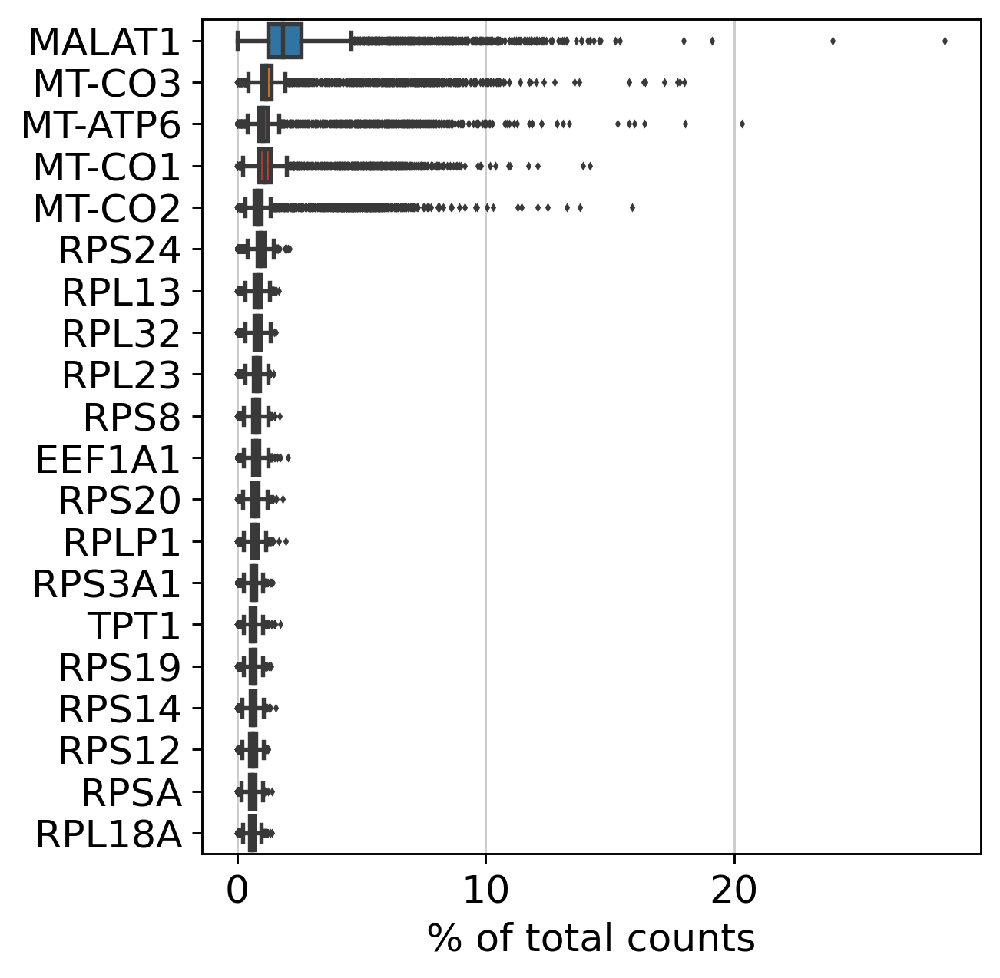

In [7]:
#preprocessing
sc.pl.highest_expr_genes(adata2, n_top=20)

In [8]:
# Quality control - calculate QC covariates
adata2.obs['n_counts'] = adata2.X.sum(1)
adata2.obs['log_counts'] = np.log(adata2.obs['n_counts'])
adata2.obs['n_genes'] = (adata2.X > 0).sum(1)

mito_genes = adata2.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata2.obs['mt_frac'] = np.sum(
    adata2[:, mito_genes].X, axis=1).A1 / np.sum(adata2.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata2.obs['n_counts'] = adata2.X.sum(axis=1).A1

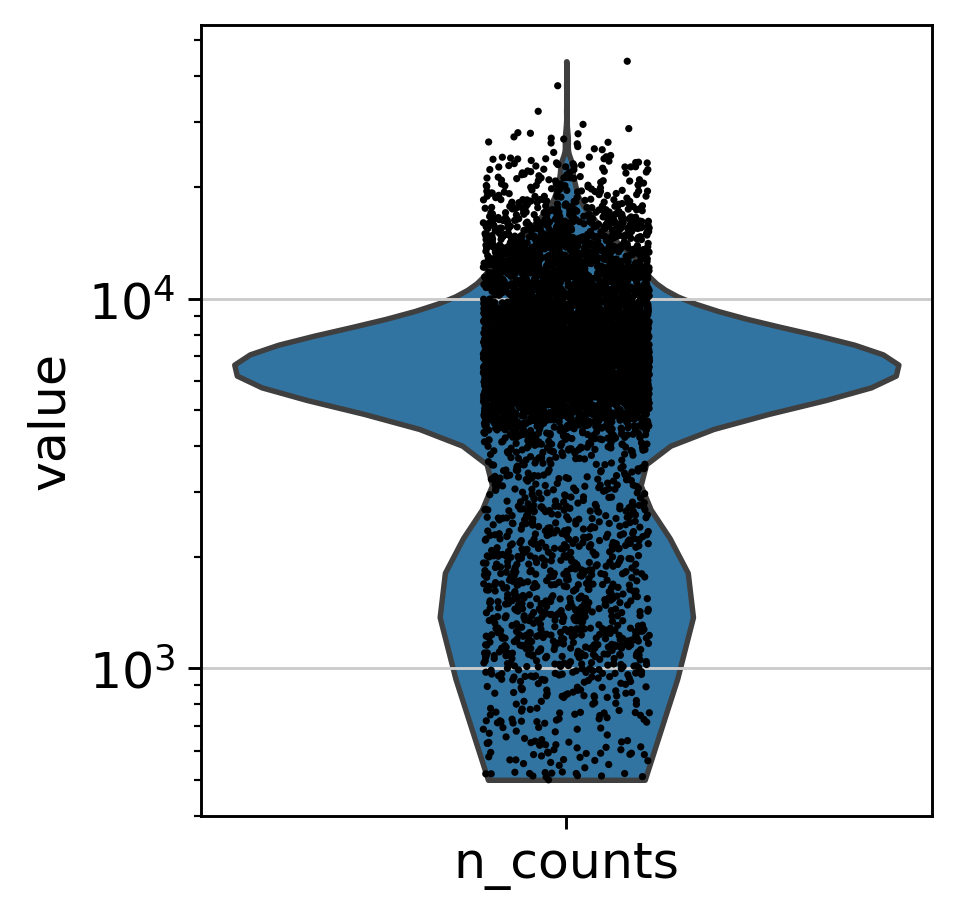

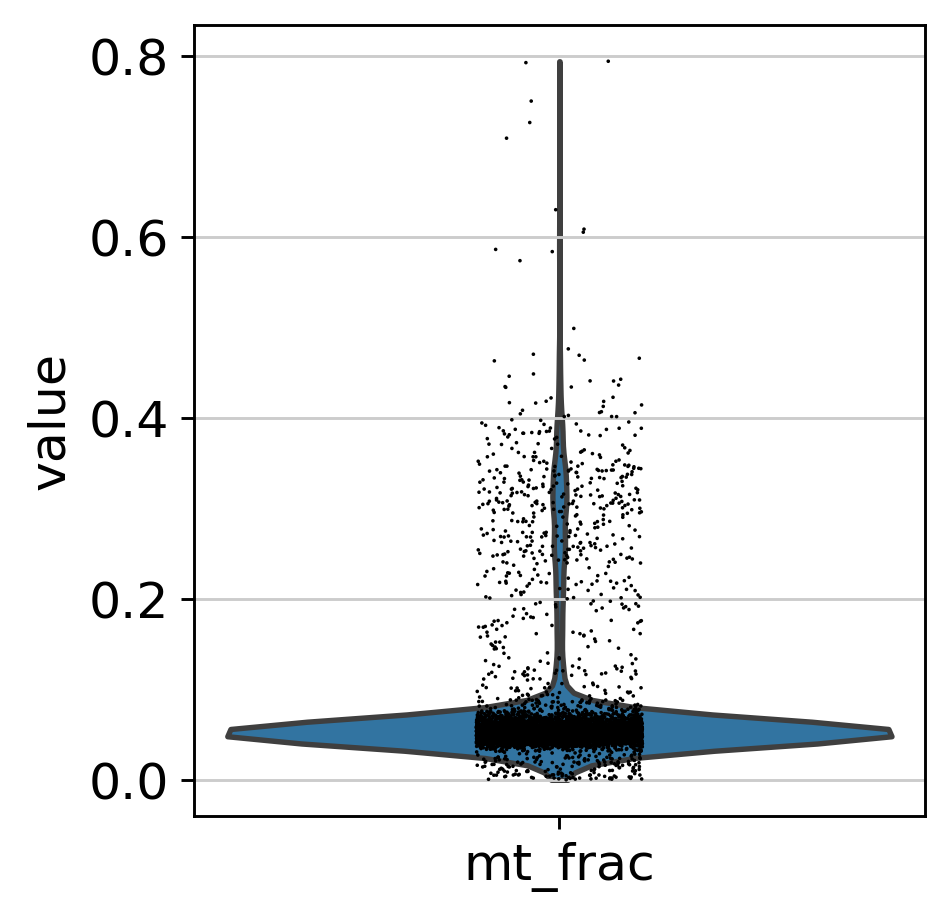

In [9]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata2, 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata2, 'mt_frac')

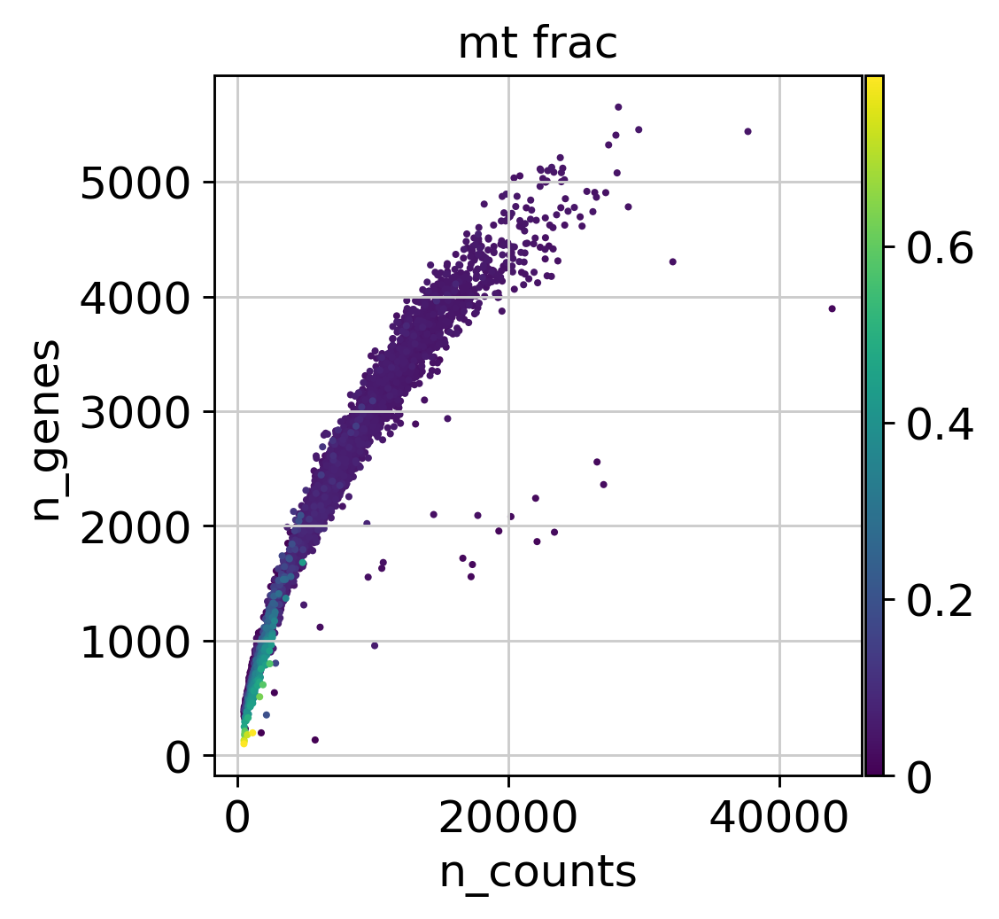

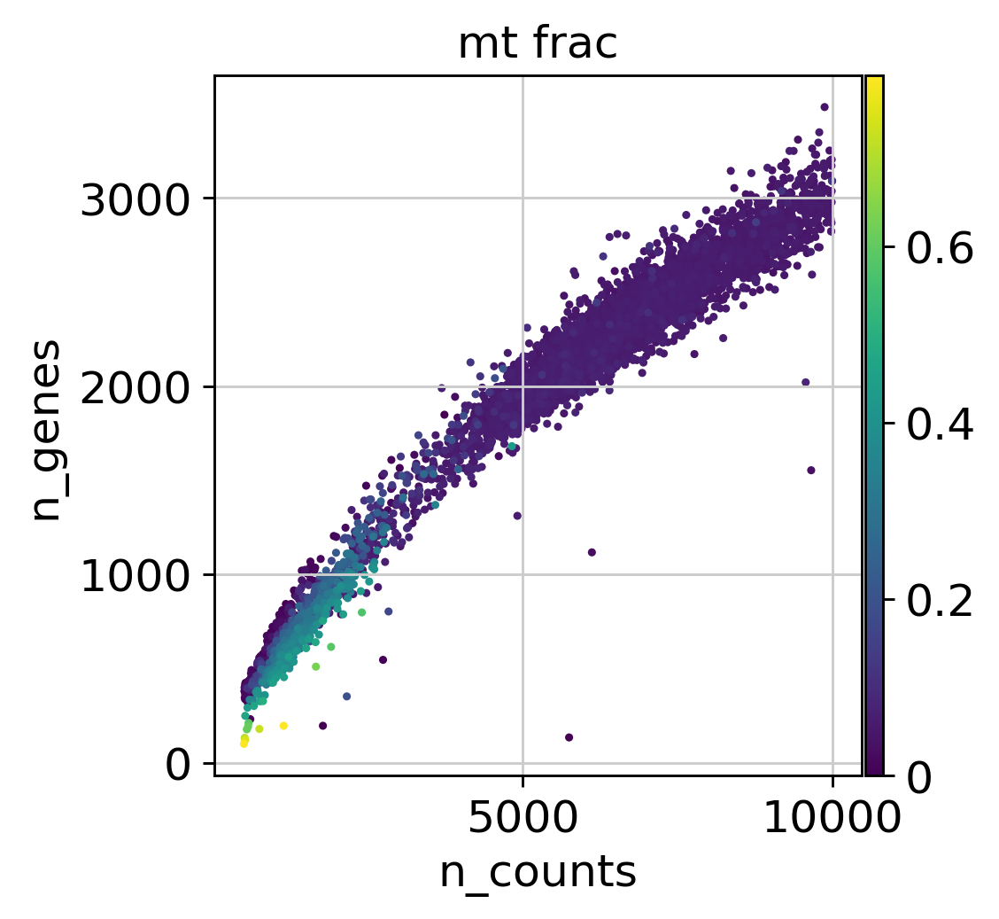

In [10]:
#Data quality summary plots
p1 = sc.pl.scatter(adata2, 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata2[adata2.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

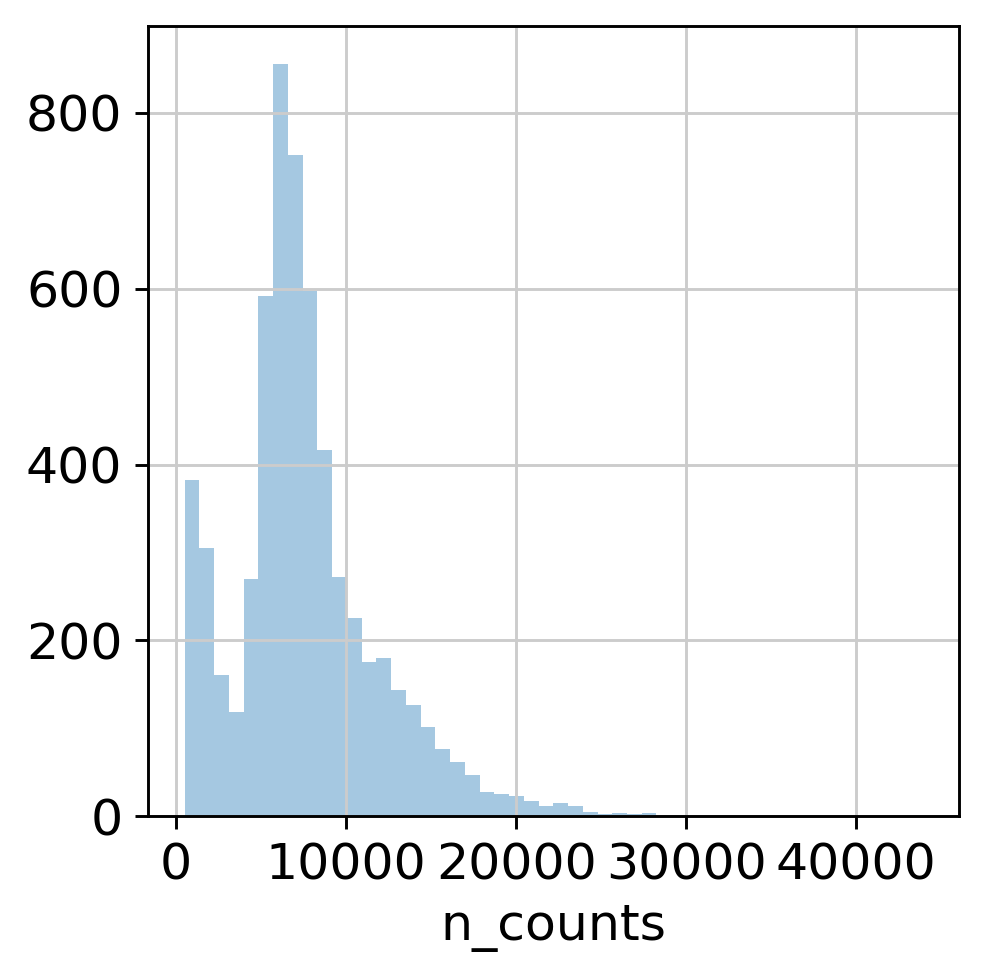

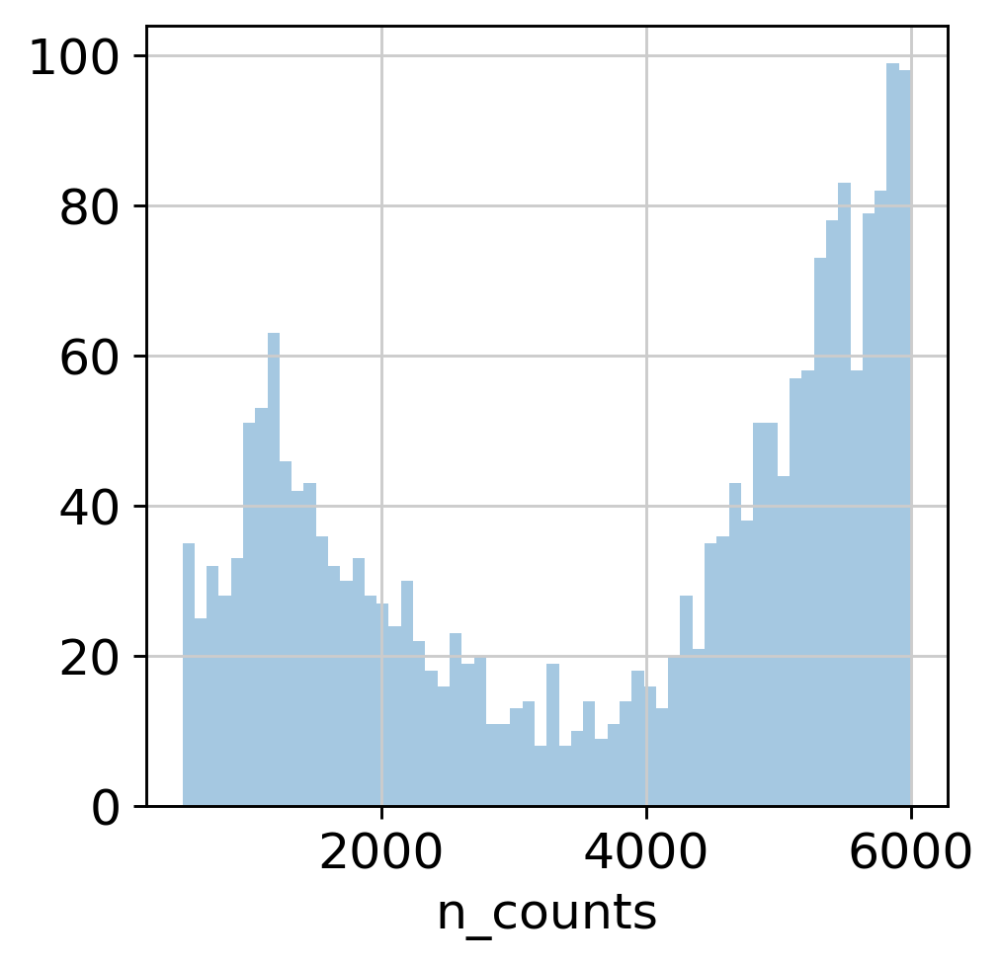

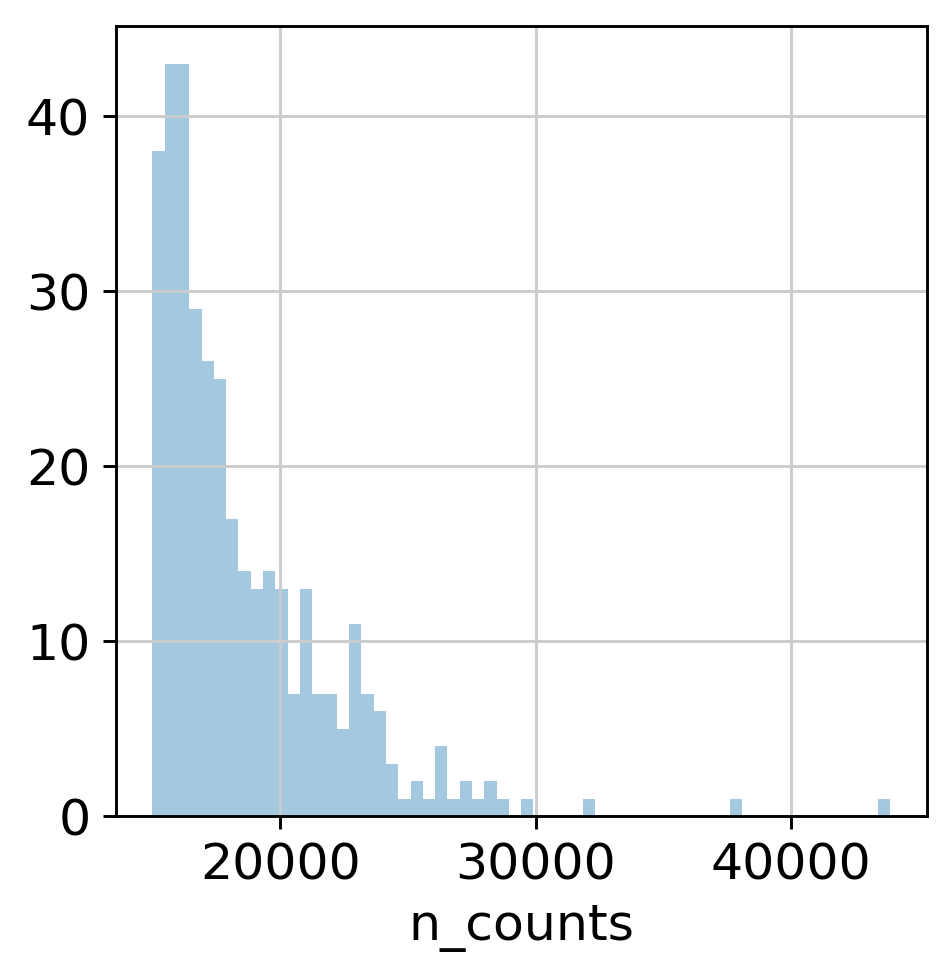

In [11]:
#Thresholding decision: counts
p3 = sb.distplot(adata2.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata2.obs['n_counts'][adata2.obs['n_counts']<6000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata2.obs['n_counts'][adata2.obs['n_counts']>15000], kde=False, bins=60)
plt.show()

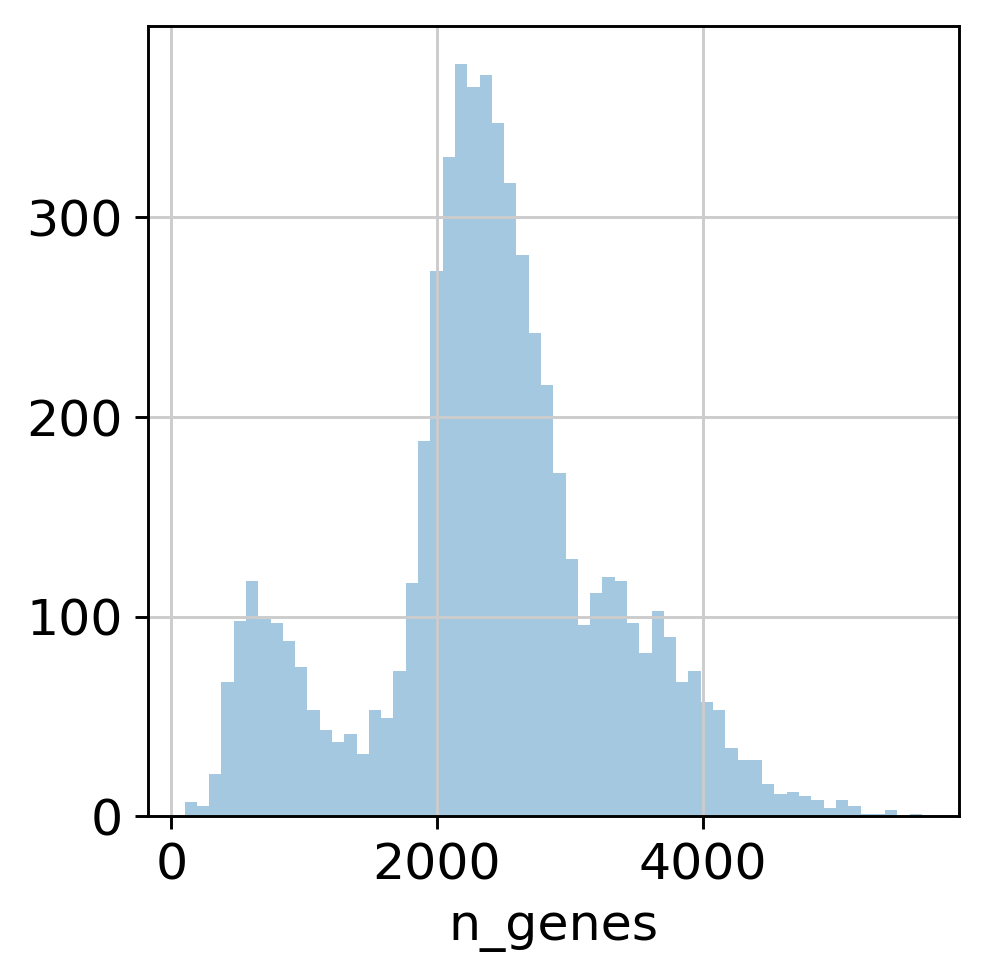

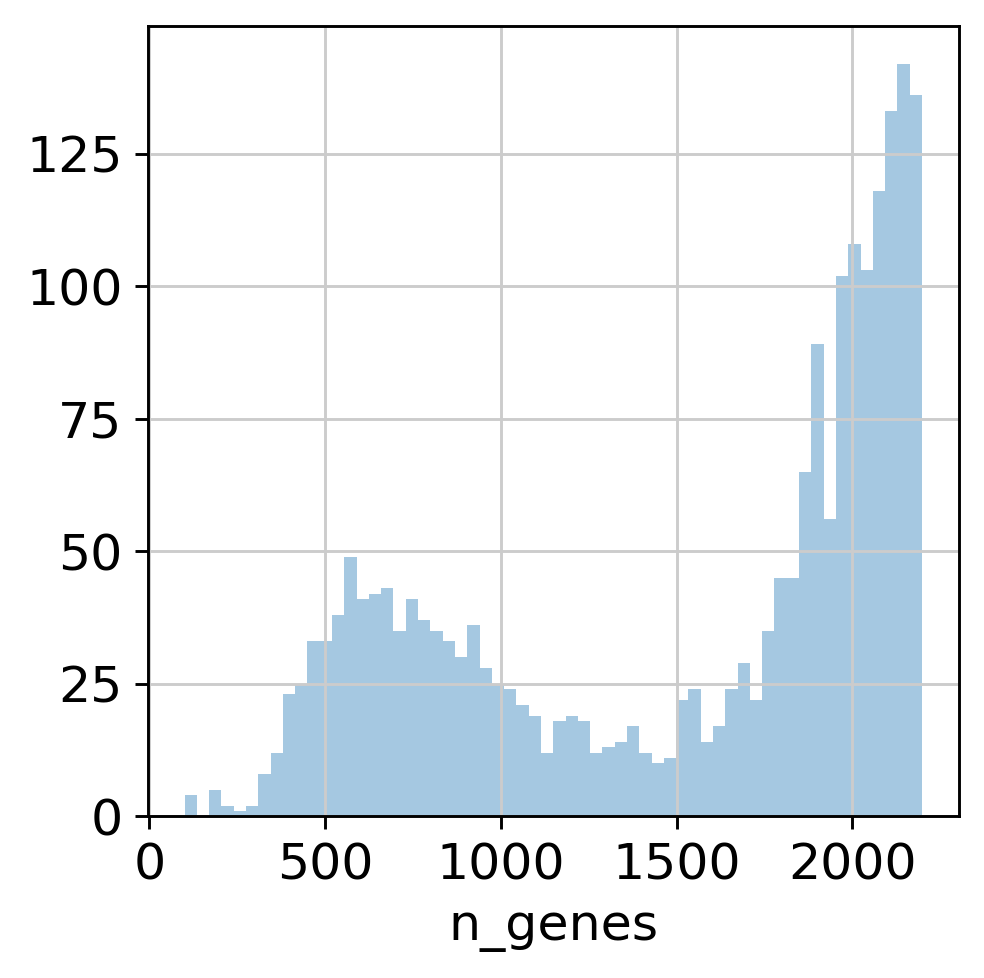

In [12]:
#Thresholding decision: genes
p6 = sb.distplot(adata2.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata2.obs['n_genes'][adata2.obs['n_genes']<2200], kde=False, bins=60)
plt.show()

In [13]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata2.n_obs))

sc.pp.filter_cells(adata2, min_counts = 3500)
print('Number of cells after min count filter: {:d}'.format(adata2.n_obs))

sc.pp.filter_cells(adata2, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata2.n_obs))

adata2 = adata2[adata2.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata2.n_obs))

sc.pp.filter_cells(adata2, min_genes = 1400)
print('Number of cells after gene filter: {:d}'.format(adata2.n_obs))

Total number of cells: 6018
filtered out 901 cells that have less than 3500 counts
Number of cells after min count filter: 5117
filtered out 3 cells that have more than 30000 counts
Number of cells after max count filter: 5114
Number of cells after MT filter: 5108
filtered out 5 cells that have less than 1400 genes expressed


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 5103


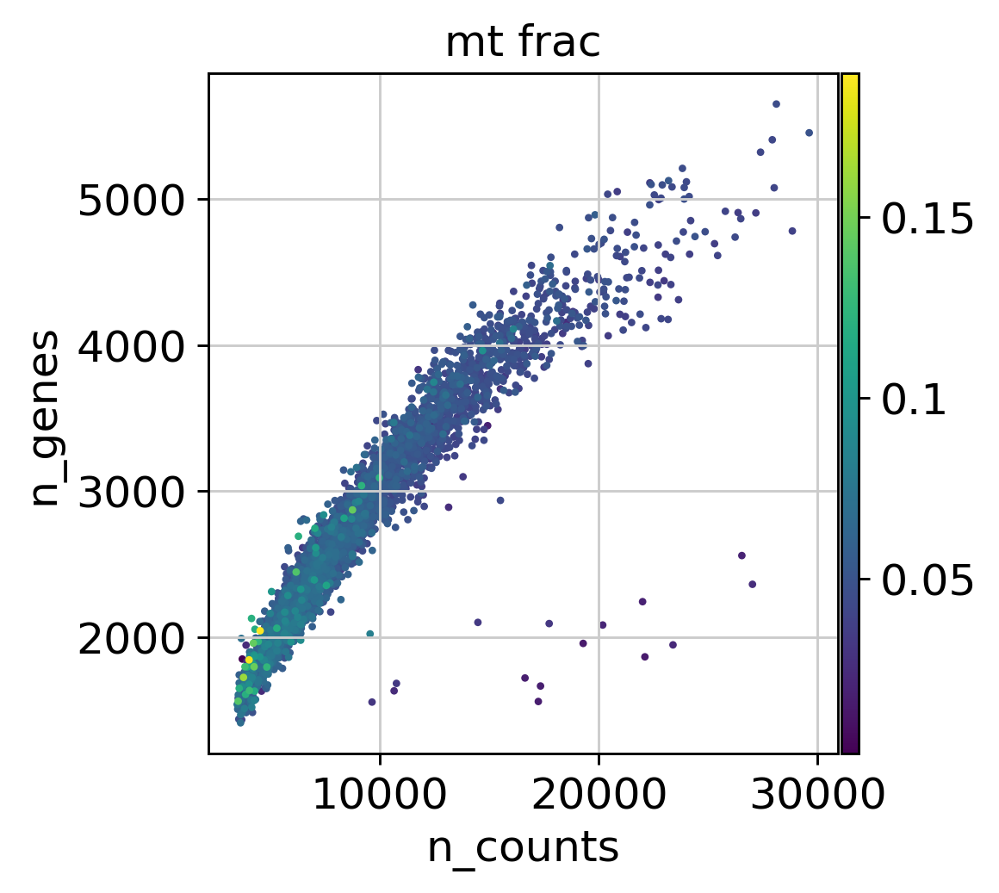

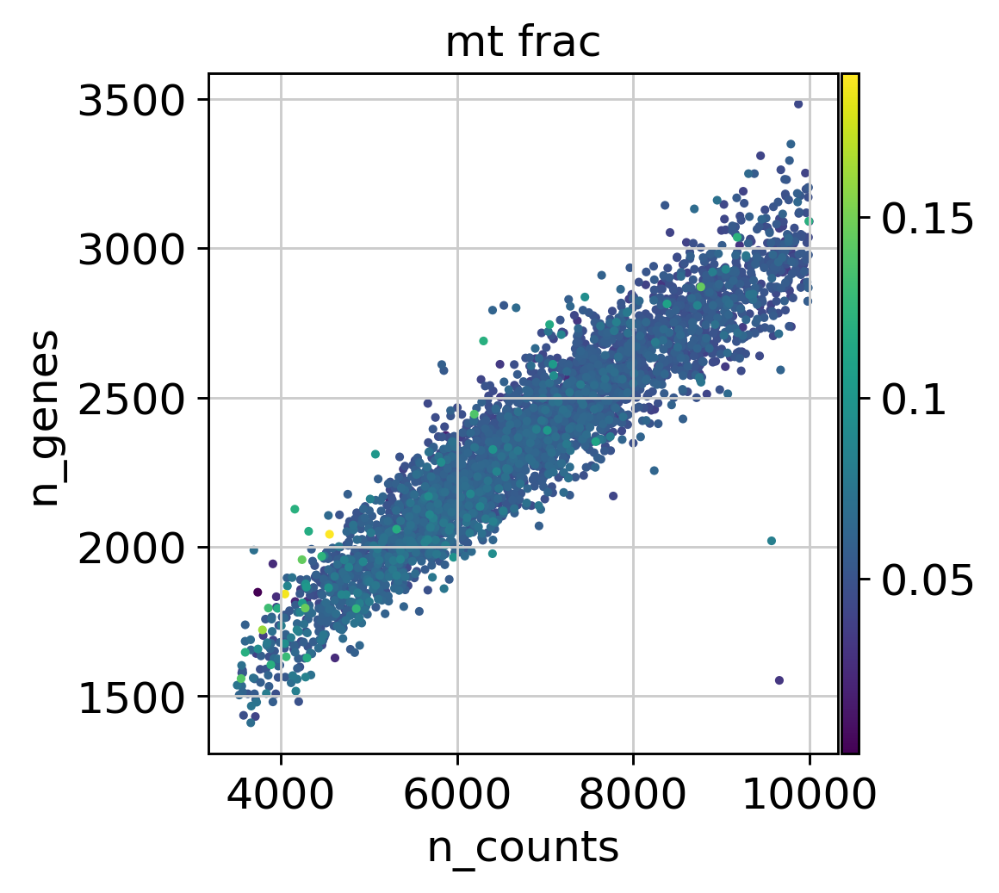

In [14]:
#Data quality summary plots after preprocessing
p1 = sc.pl.scatter(adata2, 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata2[adata2.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

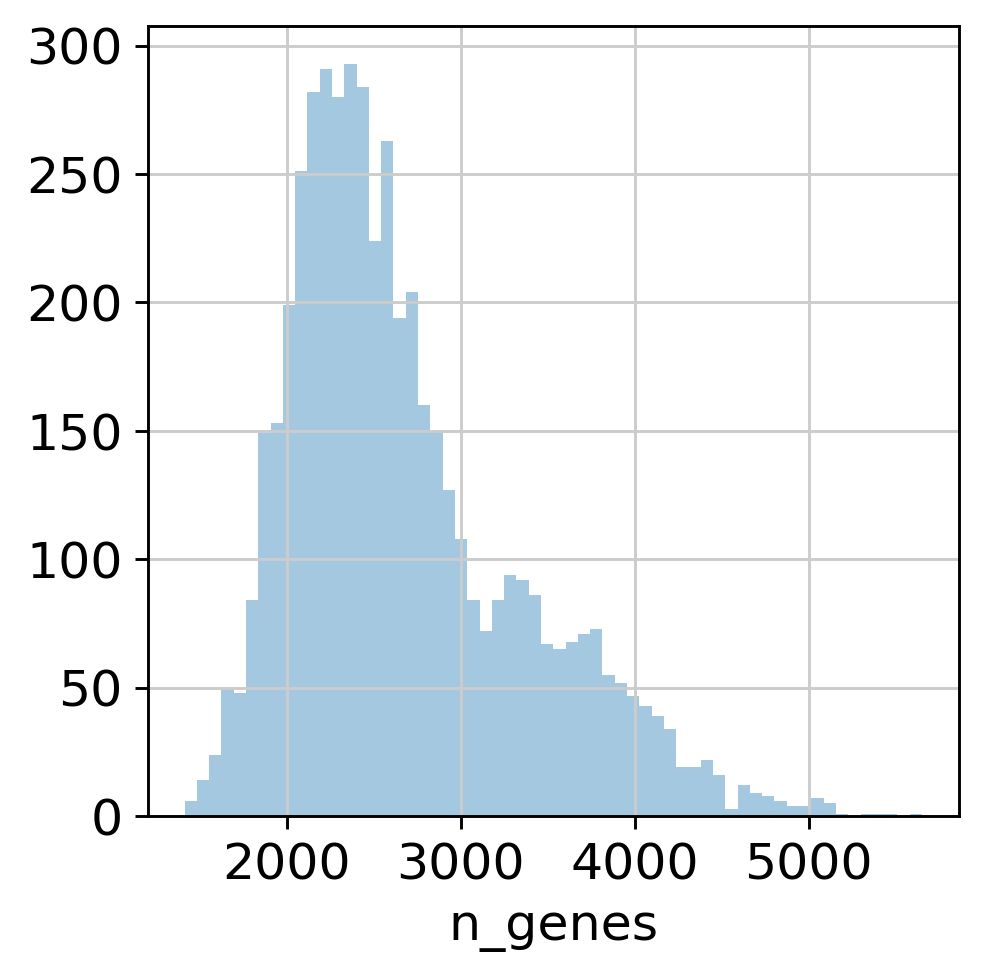

In [15]:
## n_genes after QC ##
p6 = sb.distplot(adata2.obs['n_genes'], kde=False, bins=60)
plt.show()

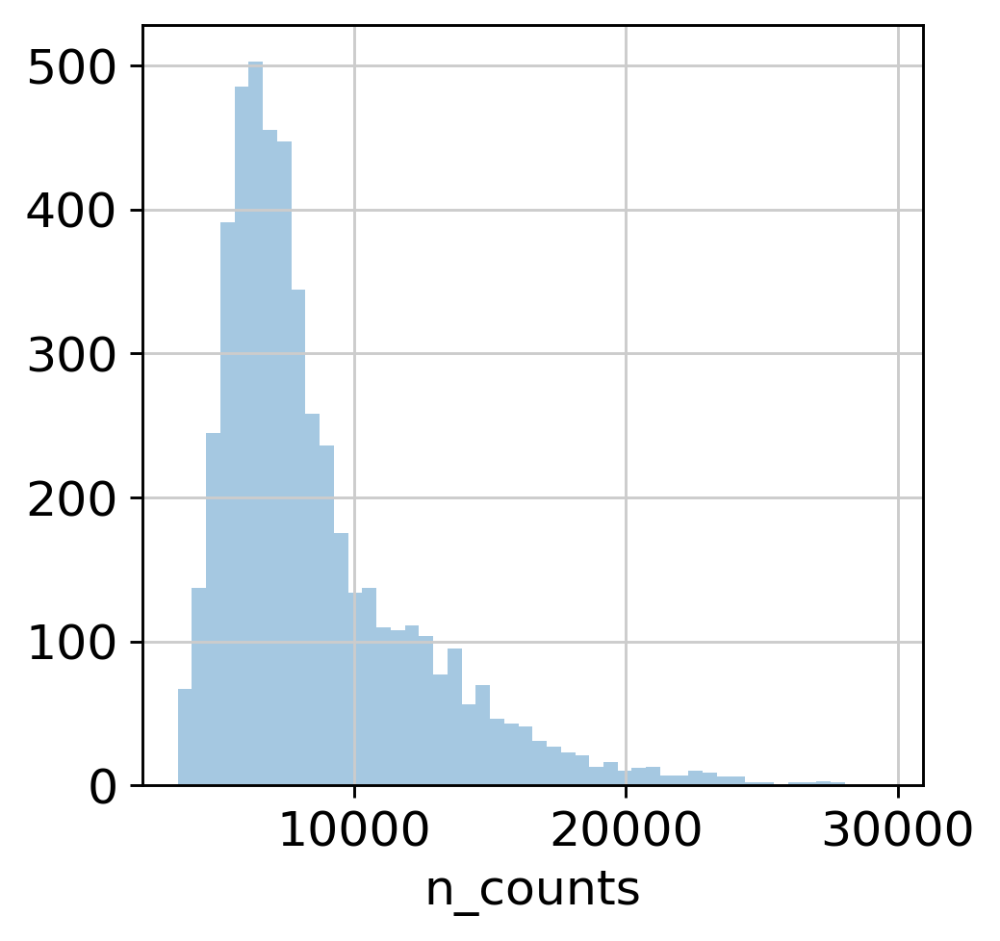

In [16]:
## n_counts after QC ##
p3 = sb.distplot(adata2.obs['n_counts'], kde=False)
plt.show()

In [17]:
##initial QC complete ##
#sc.write('/media/seth/SETH/LXR/D/D_QC_forbatch.h5ad', adata2)

## PREPROCESSING FOR db/db DMHCA DATASET ##

normalizing counts per cell
    finished (0:00:00)


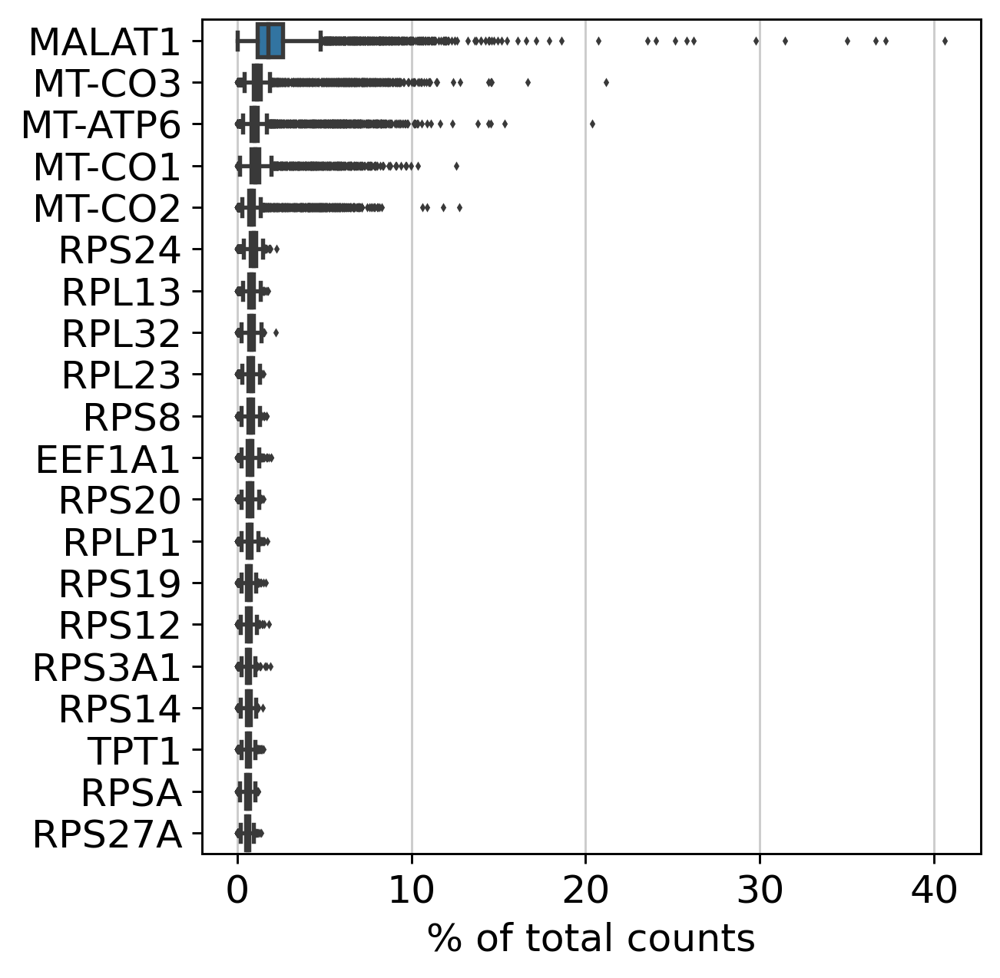

In [18]:
#preprocessing
sc.pl.highest_expr_genes(adata3, n_top=20)

In [19]:
# Quality control - calculate QC covariates
adata3.obs['n_counts'] = adata3.X.sum(1)
adata3.obs['log_counts'] = np.log(adata3.obs['n_counts'])
adata3.obs['n_genes'] = (adata3.X > 0).sum(1)

mito_genes = adata3.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata3.obs['mt_frac'] = np.sum(
    adata3[:, mito_genes].X, axis=1).A1 / np.sum(adata3.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata3.obs['n_counts'] = adata3.X.sum(axis=1).A1

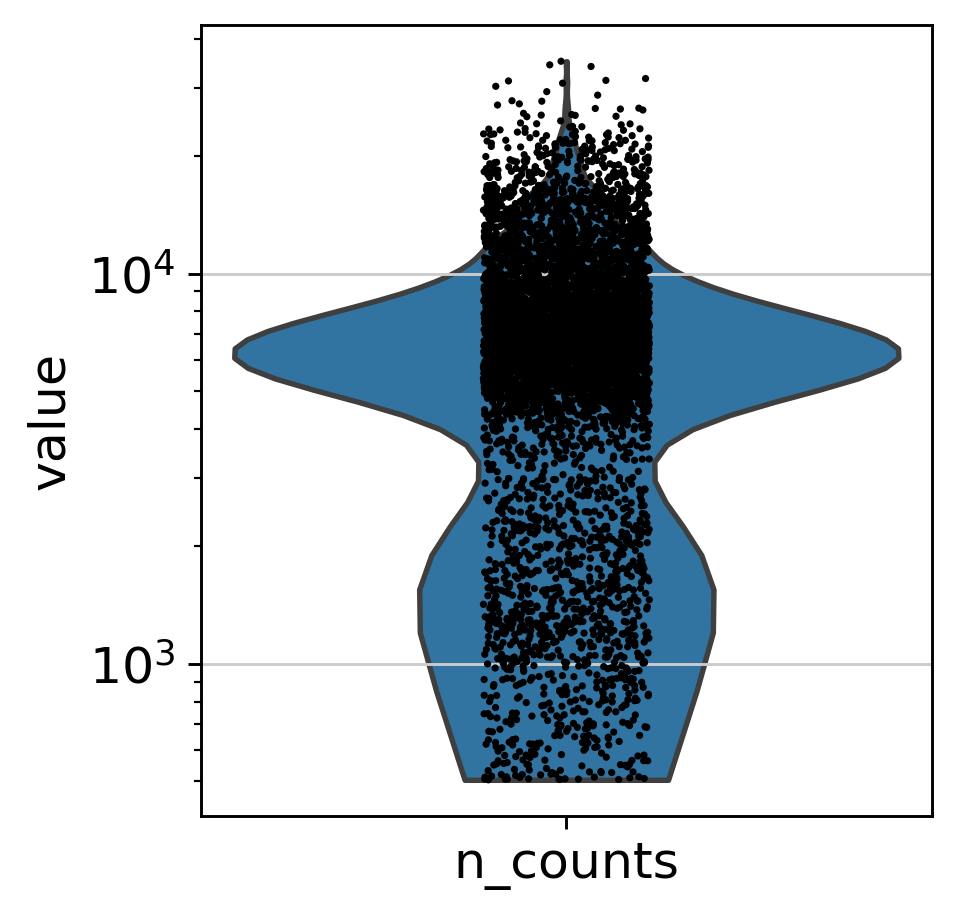

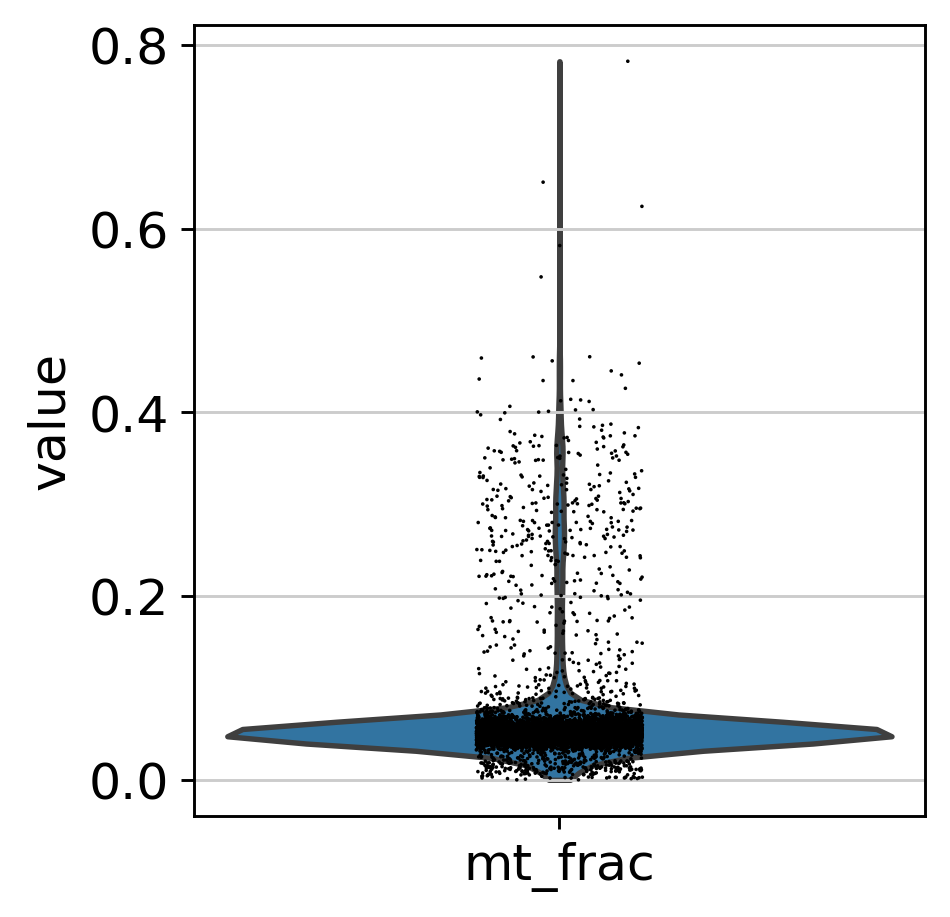

In [20]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata3, 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata3, 'mt_frac')

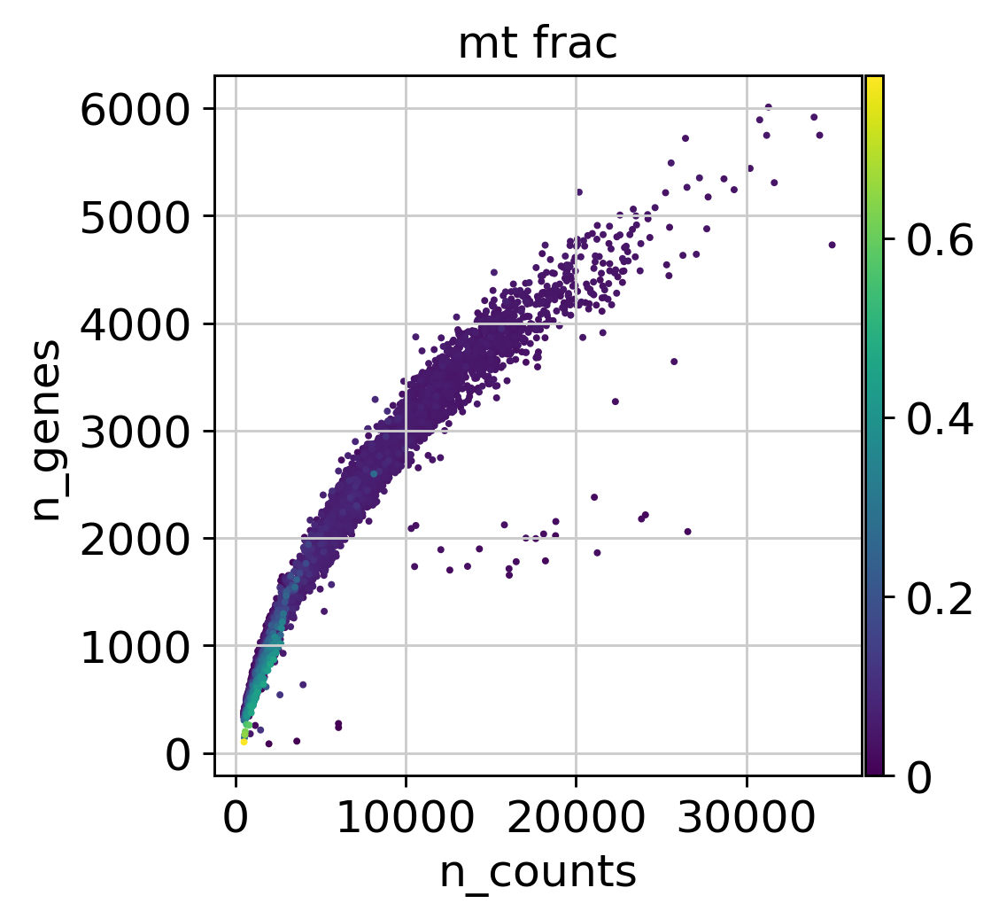

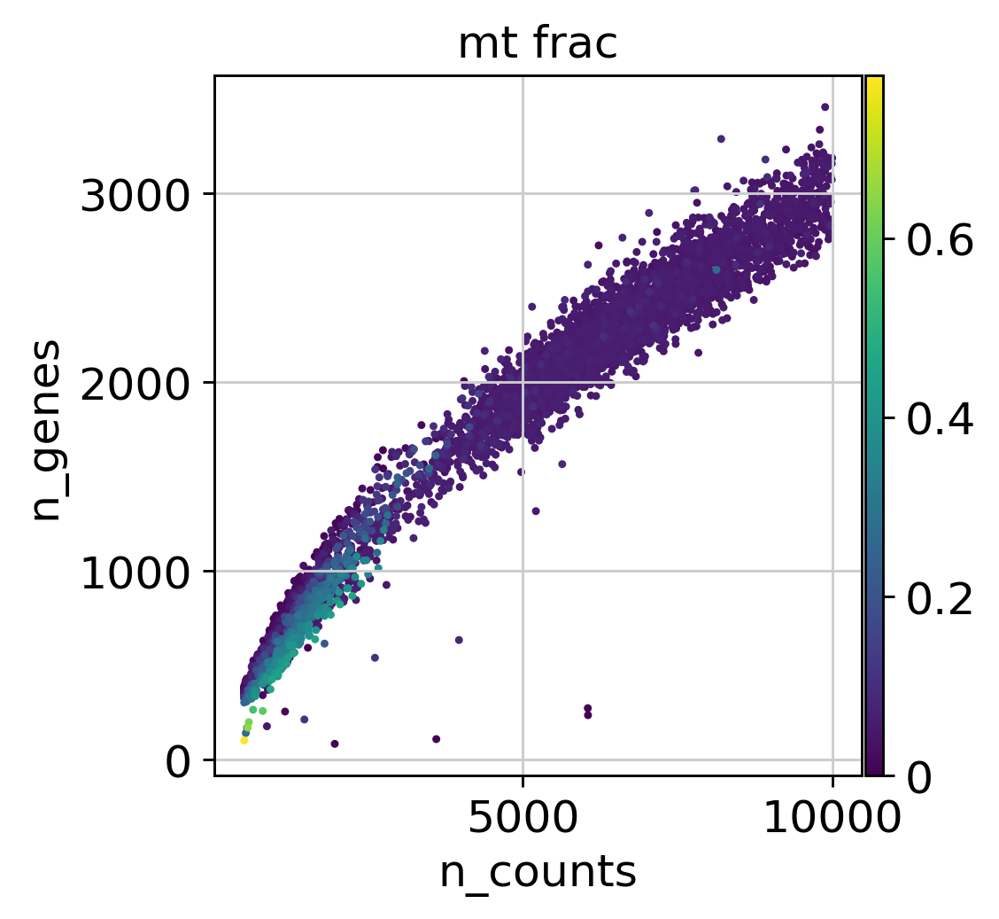

In [21]:
#Data quality summary plots
p1 = sc.pl.scatter(adata3, 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata3[adata3.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

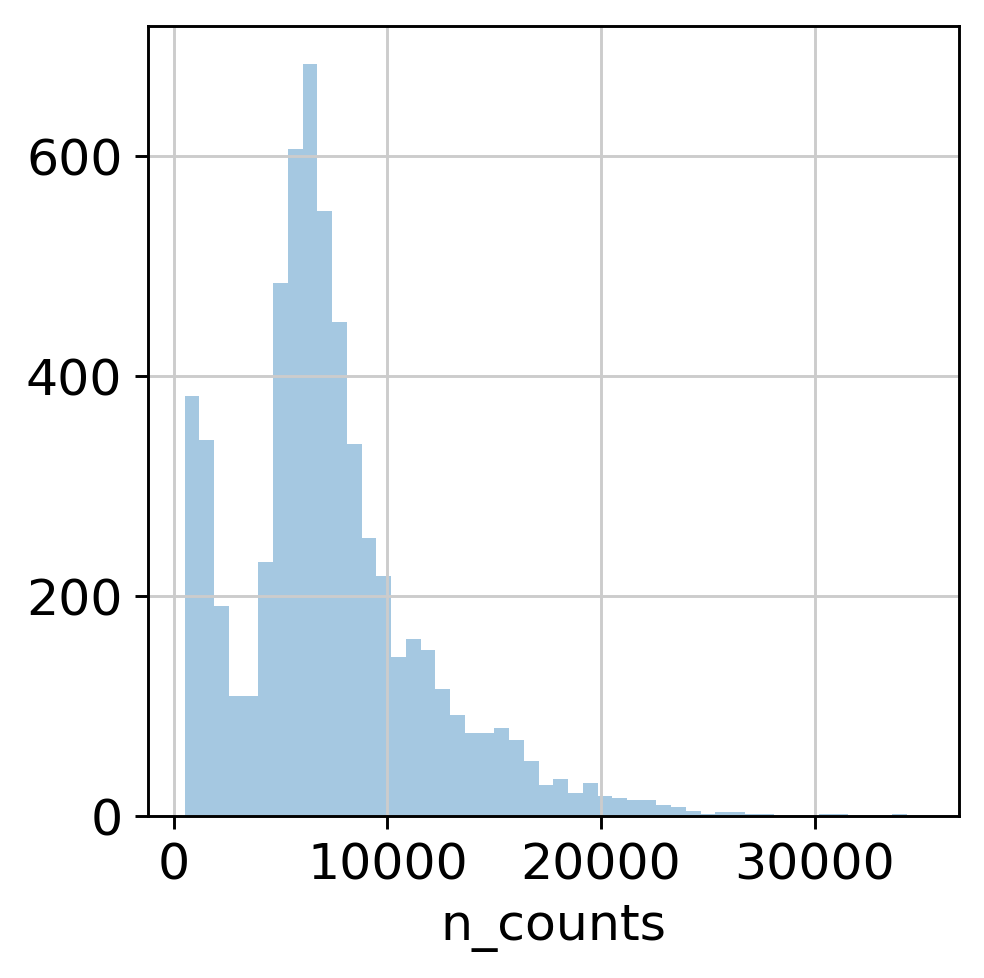

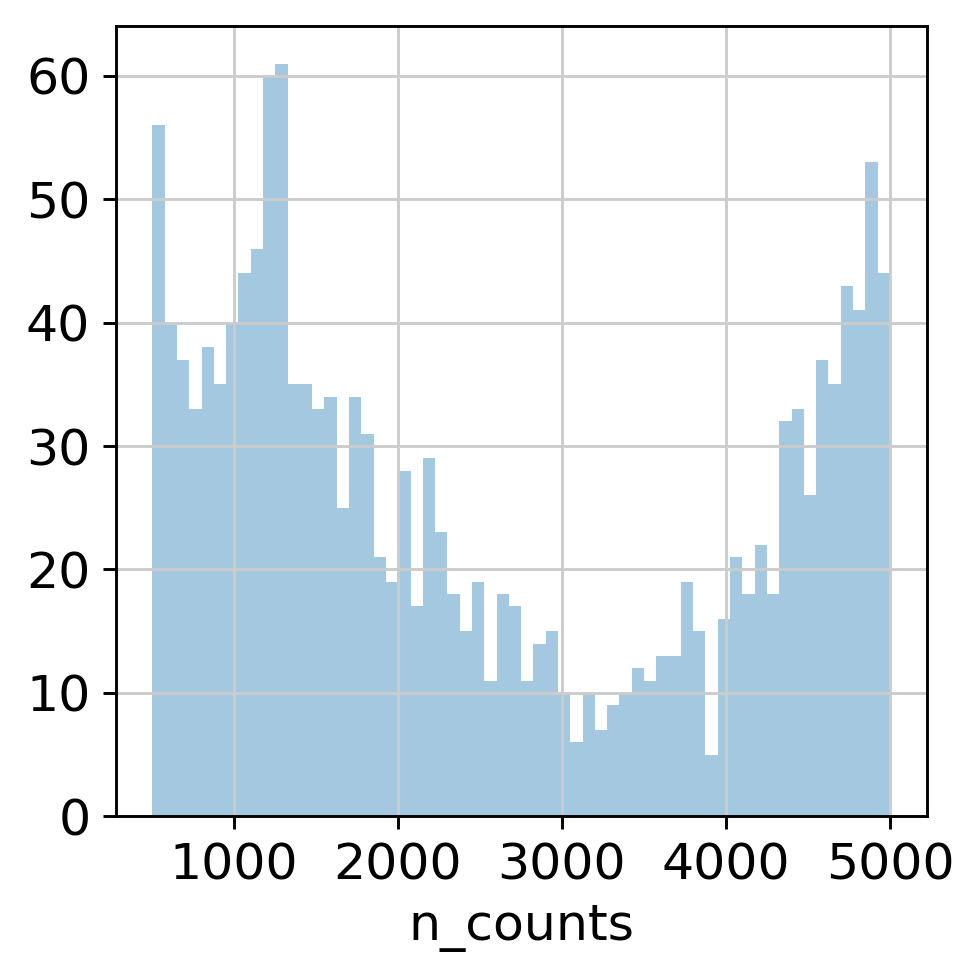

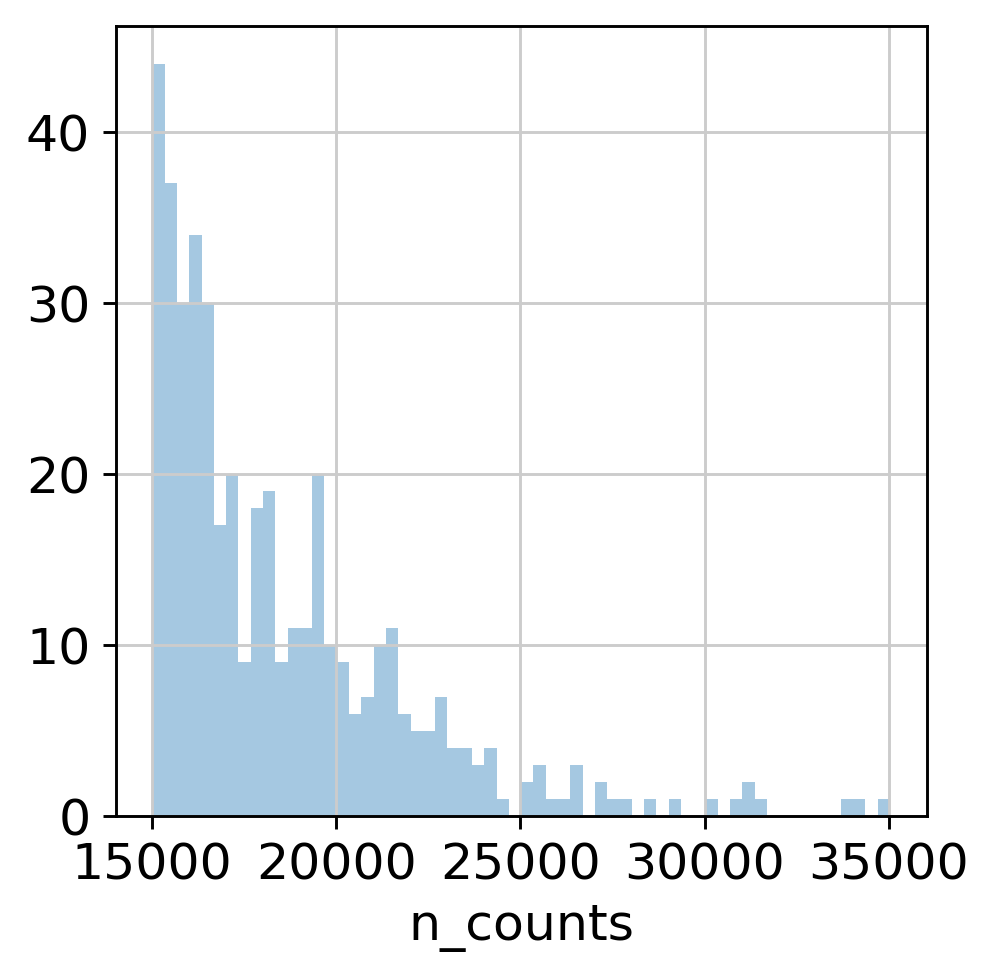

In [22]:
#Thresholding decision: counts
p3 = sb.distplot(adata3.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata3.obs['n_counts'][adata3.obs['n_counts']<5000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata3.obs['n_counts'][adata3.obs['n_counts']>15000], kde=False, bins=60)
plt.show()

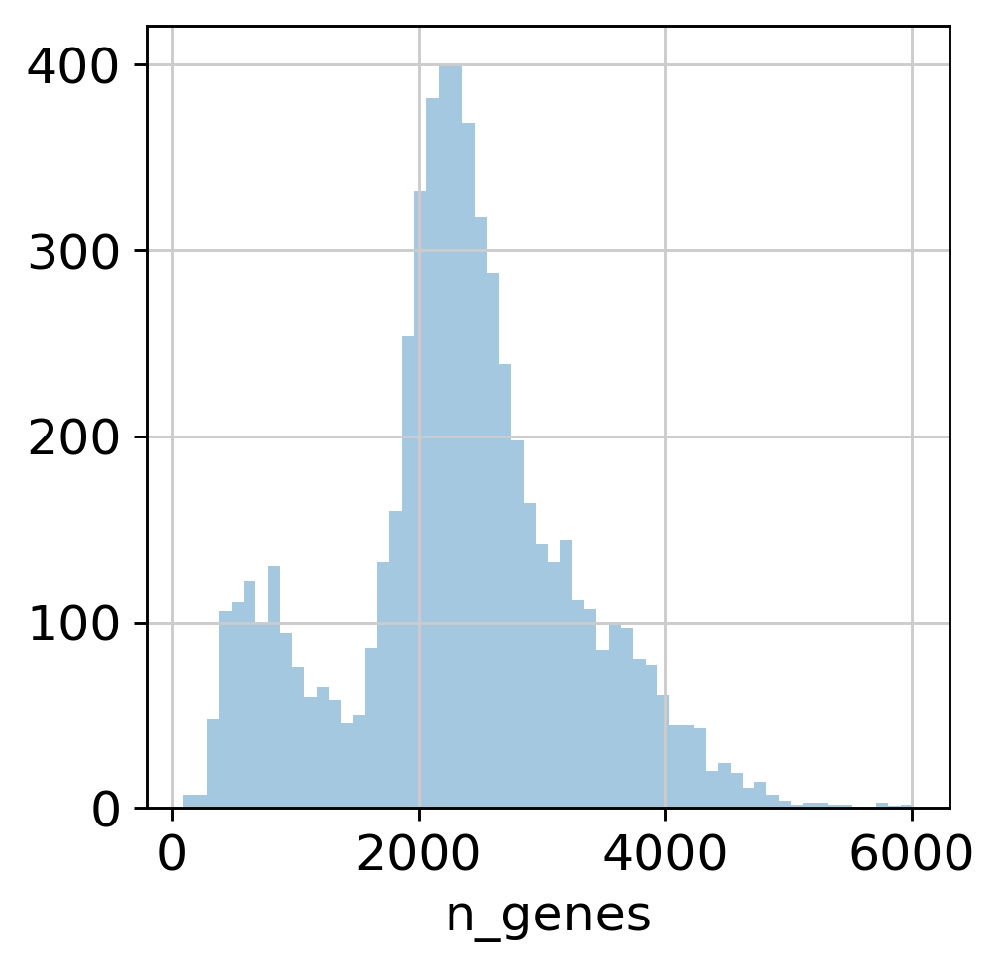

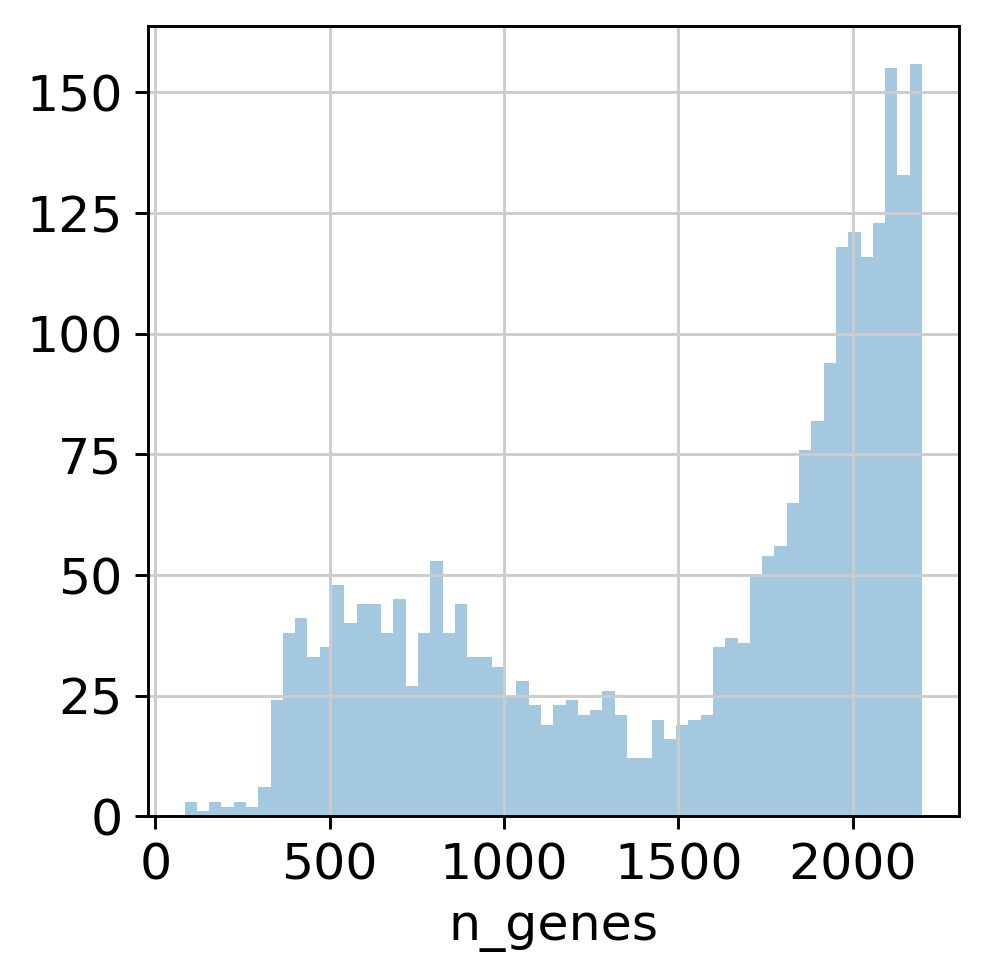

In [23]:
#Thresholding decision: genes
p6 = sb.distplot(adata3.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata3.obs['n_genes'][adata3.obs['n_genes']<2200], kde=False, bins=60)
plt.show()

In [24]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata3.n_obs))

sc.pp.filter_cells(adata3, min_counts = 3100)
print('Number of cells after min count filter: {:d}'.format(adata3.n_obs))

sc.pp.filter_cells(adata3, max_counts = 28000)
print('Number of cells after max count filter: {:d}'.format(adata3.n_obs))

adata3 = adata3[adata3.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata3.n_obs))

sc.pp.filter_cells(adata3, min_genes = 1400)
print('Number of cells after gene filter: {:d}'.format(adata3.n_obs))

Total number of cells: 6188
filtered out 1003 cells that have less than 3100 counts
Number of cells after min count filter: 5185
filtered out 10 cells that have more than 28000 counts
Number of cells after max count filter: 5175
Number of cells after MT filter: 5172
filtered out 20 cells that have less than 1400 genes expressed


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 5152


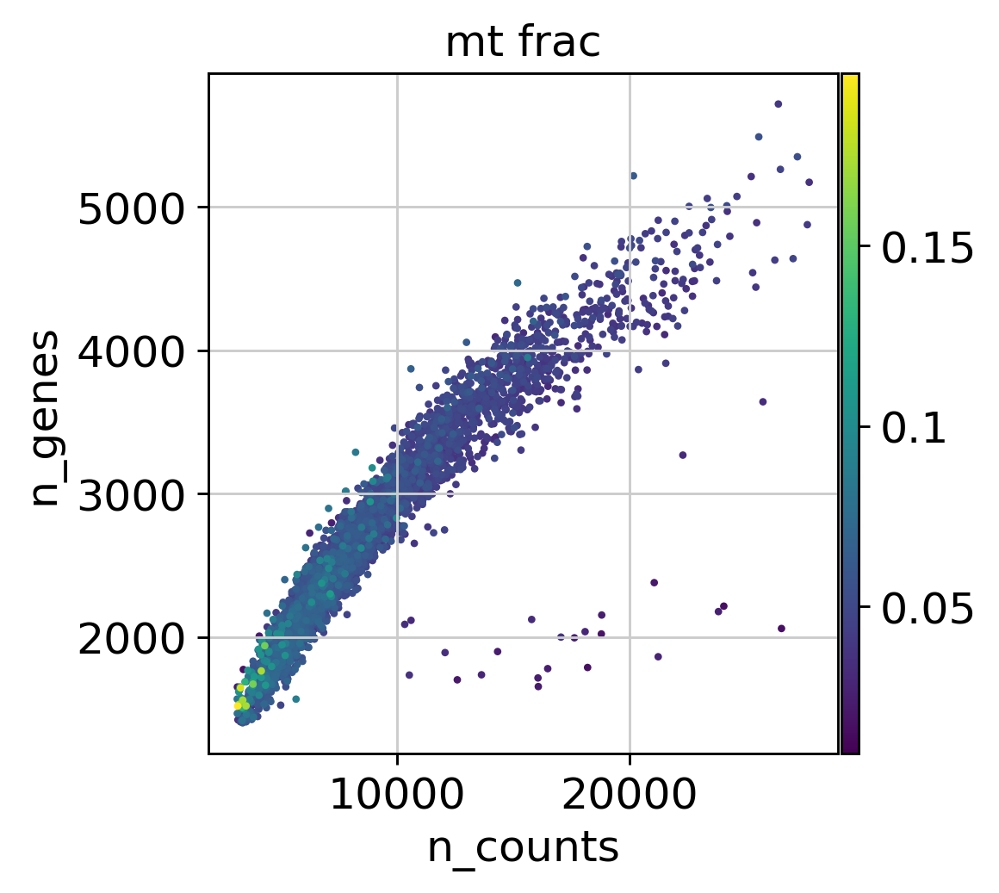

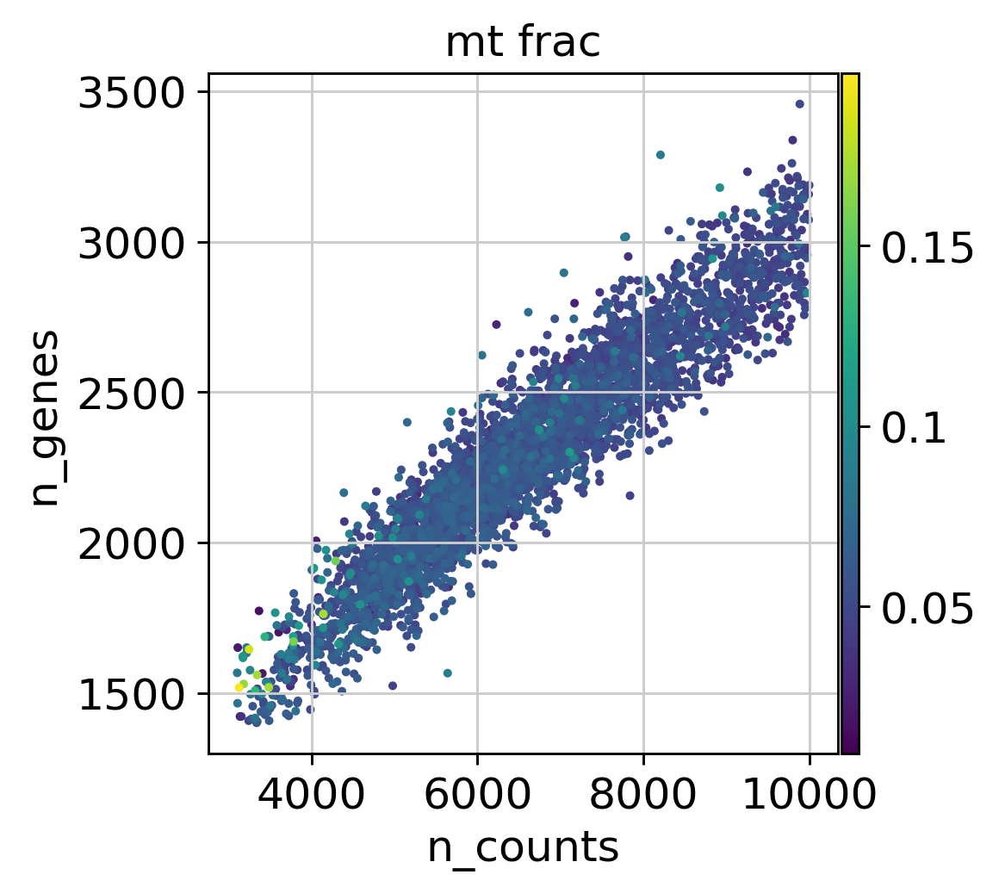

In [25]:
#Data quality summary plots after preprocessing
p1 = sc.pl.scatter(adata3, 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata3[adata3.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

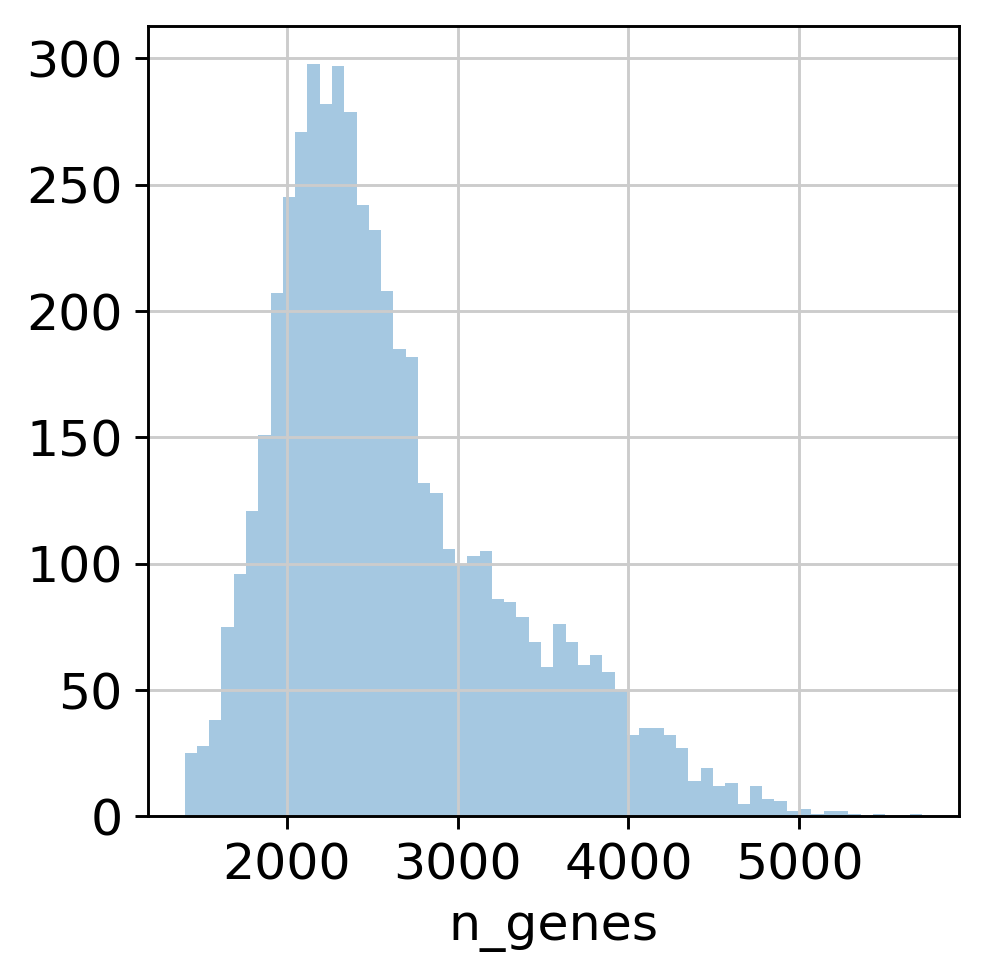

In [26]:
## n_genes after QC ##
p6 = sb.distplot(adata3.obs['n_genes'], kde=False, bins=60)
plt.show()

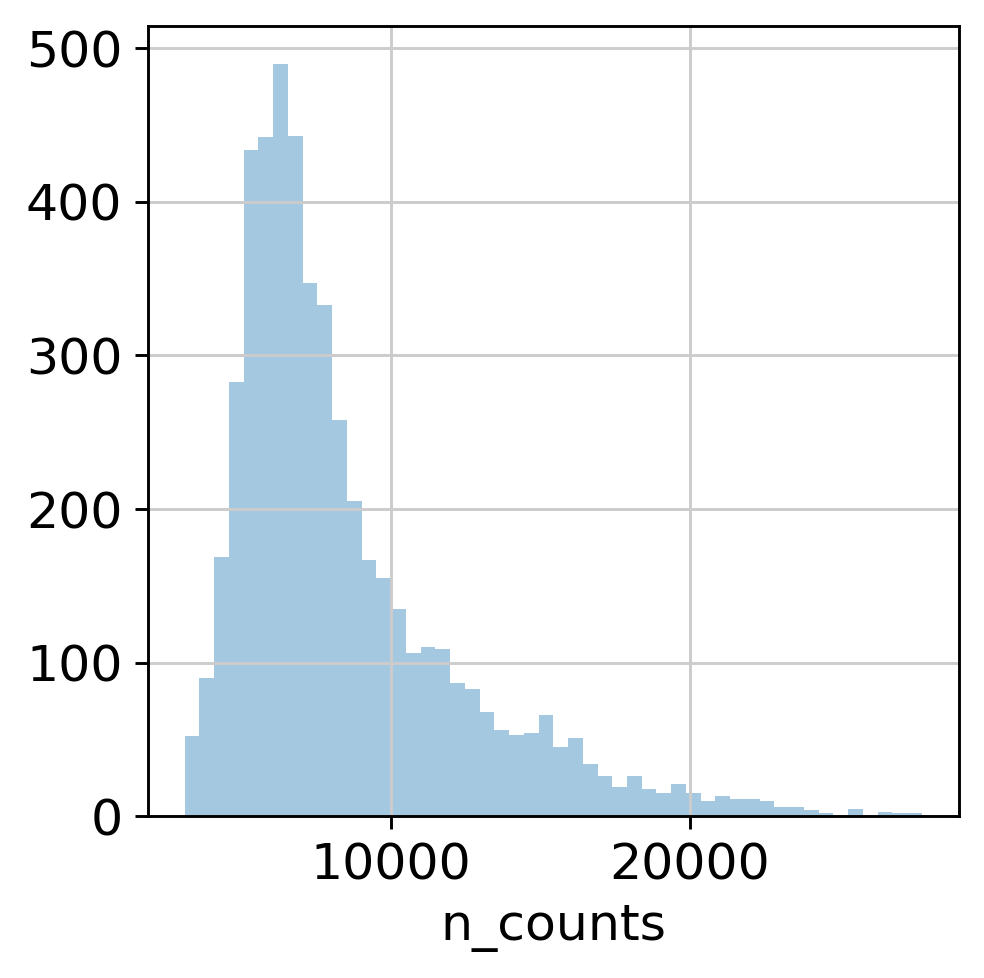

In [27]:
## n_counts after QC ##
p3 = sb.distplot(adata3.obs['n_counts'], kde=False)
plt.show()

In [28]:
##initial QC complete ##
#sc.write('/media/seth/SETH/LXR/DD/DD_QC_forbatch.h5ad', adata3)

## CONCATENATE DATASETS ##

In [29]:
adata2.X = adata2.X.toarray()
adata3.X = adata3.X.toarray()

In [30]:
adata = adata2.concatenate(adata3, batch_key='sample_id', batch_categories=['db','db_tx'])
adata

AnnData object with n_obs × n_vars = 10255 × 31053 
    obs: 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'sample_id'
    var: 'gene_ids'

In [31]:
adata.obs_names = [c.split("-")[0] for c in adata.obs_names]
adata.obs_names_make_unique(join='_')

In [32]:
#adata.X = adata.X.toarray()
adata.X = adata.X.astype('float64')


In [33]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 10 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31053
filtered out 16102 genes that are detected in less than 10 cells
Number of genes after cell filter: 14951


In [34]:
## save concatenate file ##
#sc.write('/media/seth/SETH/LXR/ConcatenateJustDBs_QC_forbatch.h5ad', adata)

## NORMALIZATION USING SCRAN##

In [35]:
## NORMALIZATION ##
#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA with n_comps = 15
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 15


/home/seth/anaconda3/envs/scanpy/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/scanpy/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/seth/anaconda3/envs/scanpy/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/scanpy/lib/python3.7/si

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:01)


In [36]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
#adata.X = adata.X.toarray()
data_mat = adata.X.T

In [37]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [38]:
#Delete adata_pp
del adata_pp

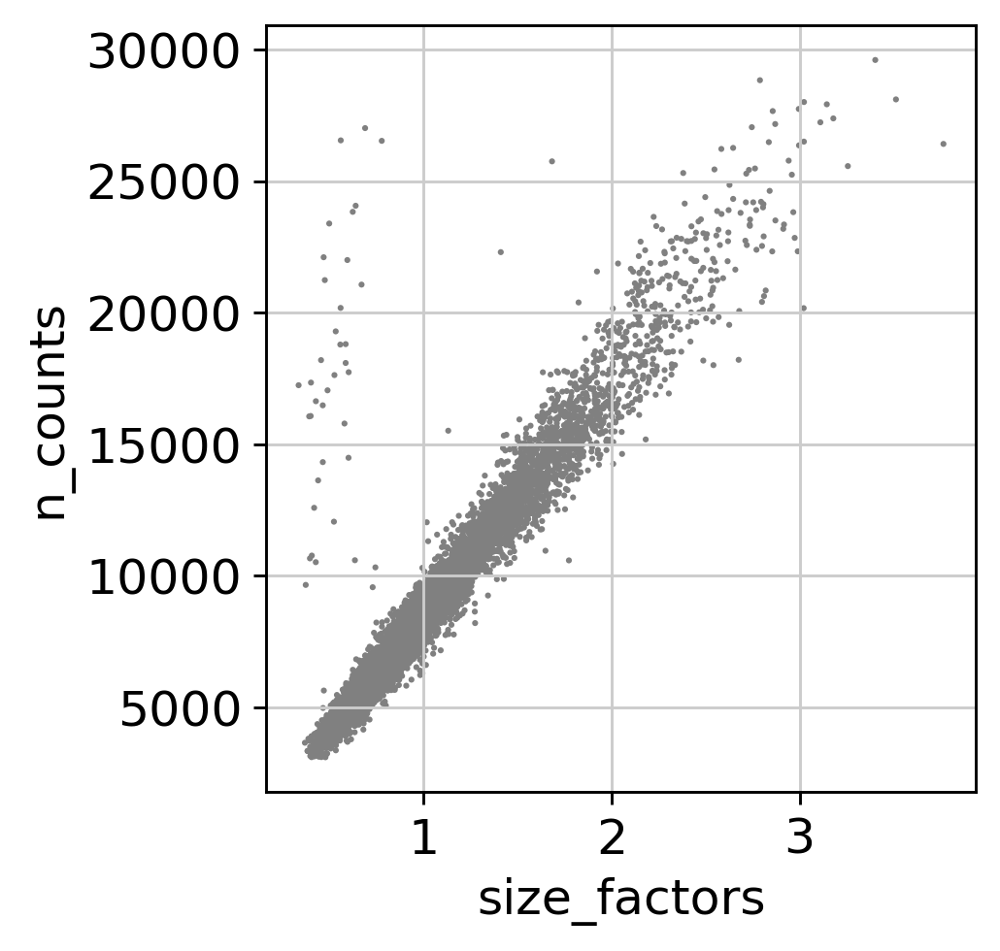

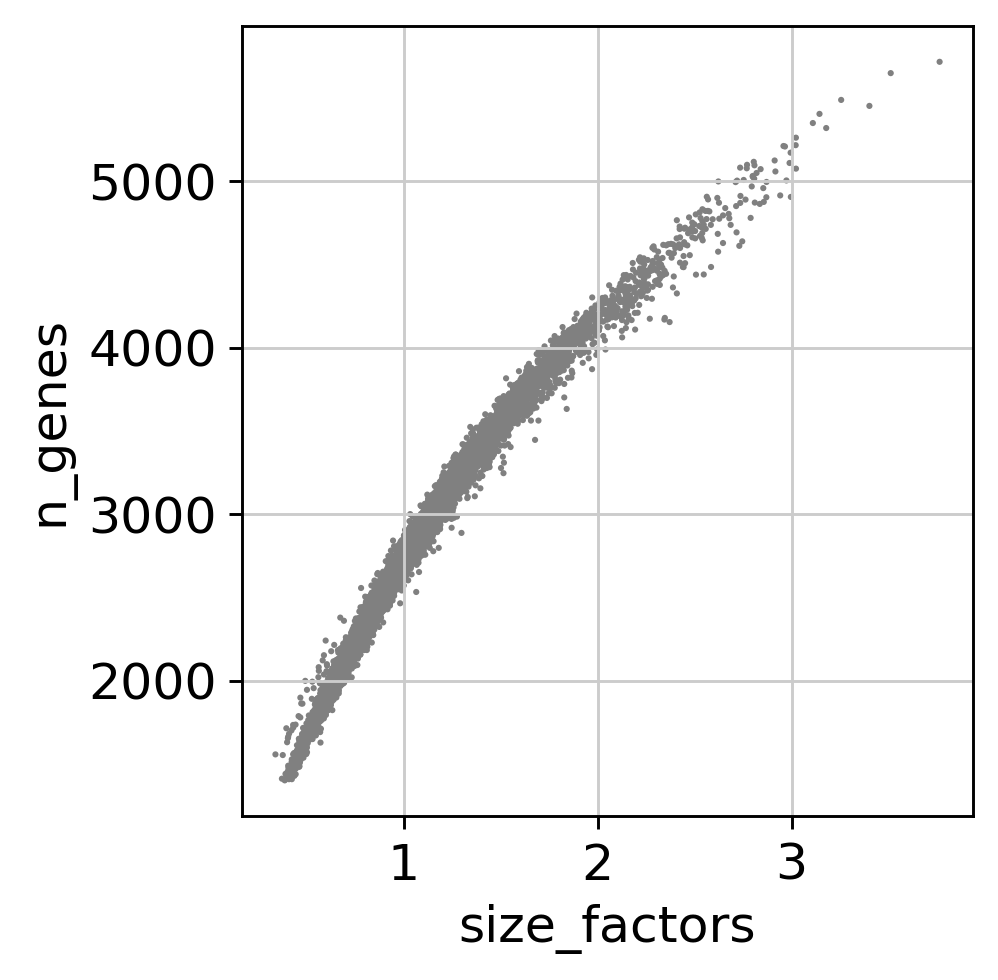

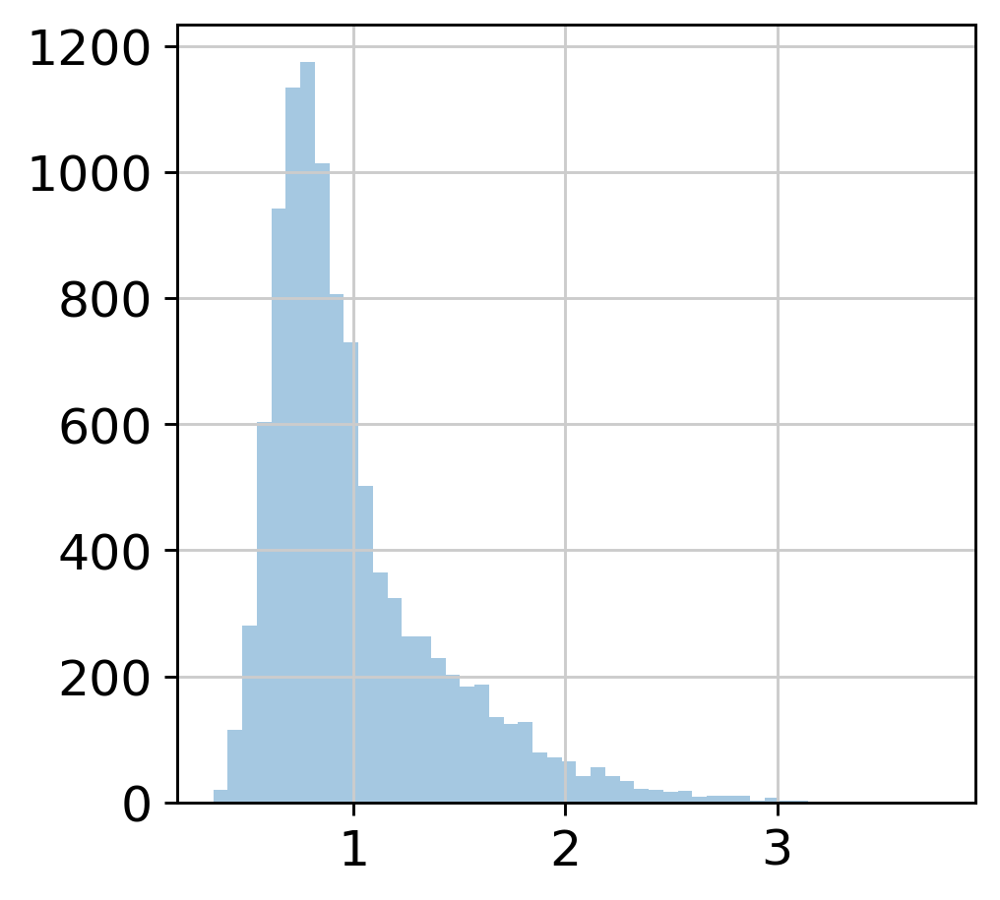

In [39]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sb.distplot(size_factors, bins=50, kde=False)
plt.show()

In [40]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [41]:
adata.write('/media/seth/SETH/LXR/final_project_norm.h5ad', compression='gzip')

In [42]:
adata

AnnData object with n_obs × n_vars = 10255 × 14951 
    obs: 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'sample_id', 'size_factors'
    var: 'gene_ids', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

## COMPLETE CELL CYCLE REGRESSION ##

In [4]:
adata = anndata.read('/media/seth/SETH/LXR/final_project_norm.h5ad')
adata

AnnData object with n_obs × n_vars = 10255 × 14951 
    obs: 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'sample_id', 'size_factors'
    var: 'gene_ids', 'n_cells'
    layers: 'counts'

In [5]:
cell_cycle_genes = [x.strip() for x in open('/home/seth/data/regev_lab_cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]

In [6]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    513 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    728 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


computing PCA with n_comps = 50
    finished (0:00:00)


... storing 'phase' as categorical


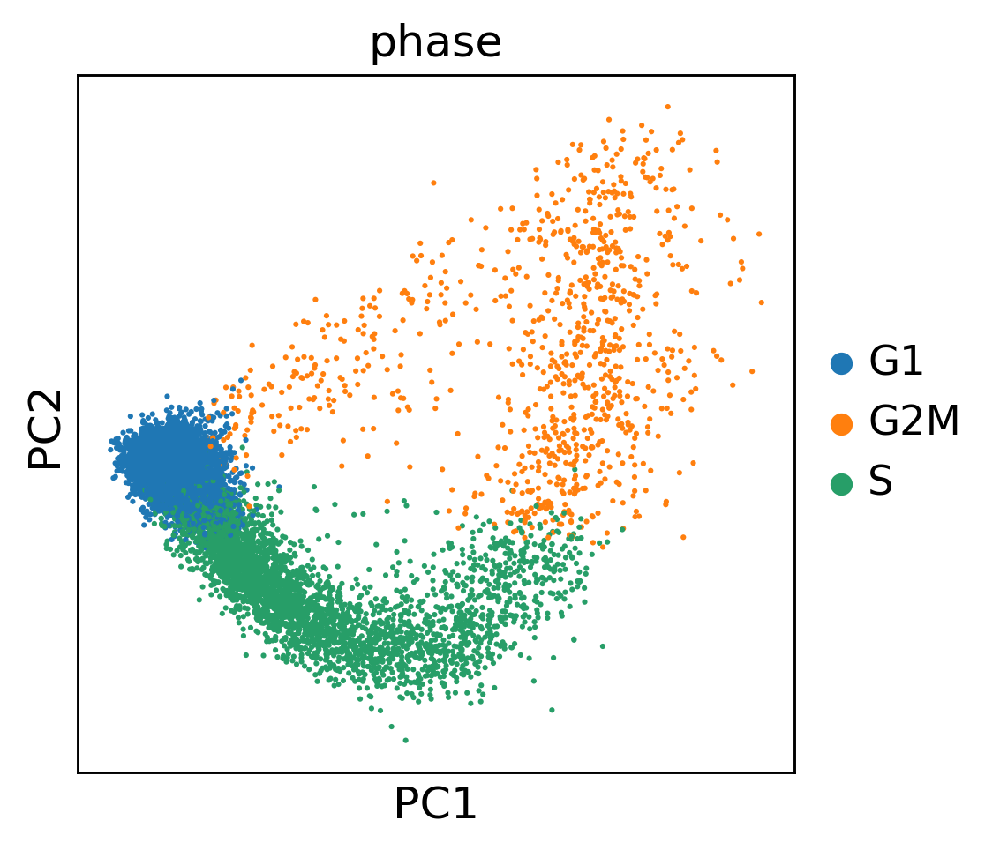

In [7]:
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')

In [8]:
sca.pp.regress_out(adata, ['S_score', 'G2M_score'])

regressing out ['S_score', 'G2M_score']


... storing 'phase' as categorical


    finished (0:01:54)


computing PCA with n_comps = 50
    finished (0:00:00)


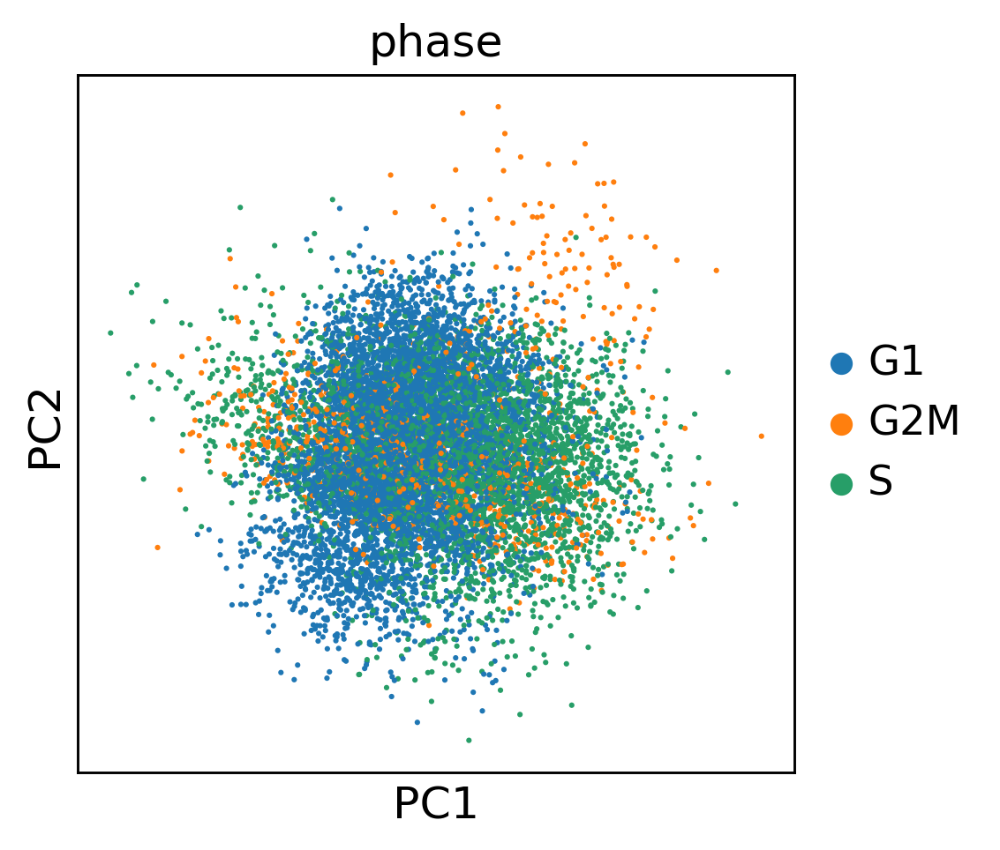

In [9]:
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')

In [10]:
adata.write('/media/seth/SETH/LXR/final_project_norm_CC.h5ad', compression='gzip')
adata

AnnData object with n_obs × n_vars = 10255 × 14951 
    obs: 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'sample_id', 'size_factors', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells'
    layers: 'counts'

## BATCH CORRECTION USING COMBAT ##

In [5]:
adata = anndata.read('/media/seth/SETH/LXR/final_project_norm_CC.h5ad')
adata

AnnData object with n_obs × n_vars = 10255 × 14951 
    obs: 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'sample_id', 'size_factors', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells'
    layers: 'counts'

In [6]:
#include CC scores as covariates
sc.pp.combat(adata, key='sample_id', covariates=['S_score', 'G2M_score'])

Standardizing Data across genes.

Found 2 batches

Found 2 numerical variables:
	S_score, G2M_score

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [7]:
#sc.write('/media/seth/SETH/LXR/COMBAT_CCcomplete_wtanddb.h5ad', adata, compression='gzip')

## HIGHLY VARIABLE GENES ##

In [8]:
## Highly variable genes ##
#import scanpy.api as sca
sca.pp.highly_variable_genes(adata, n_top_genes=4500)

print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4500


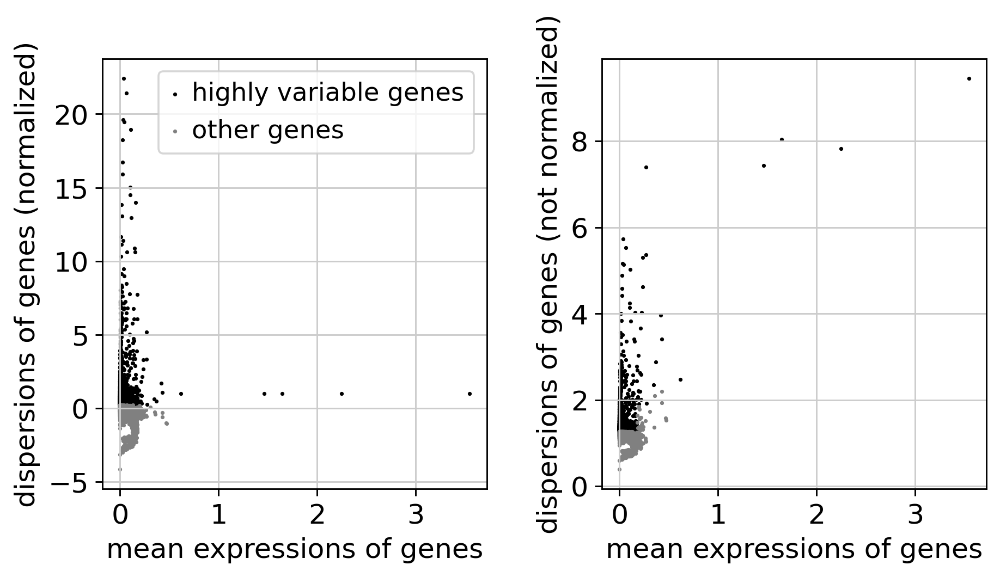

In [9]:
sc.pl.highly_variable_genes(adata)

## UNCLUSTERED VISUALIZATION ##

In [10]:
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.umap(adata)
sc.tl.diffmap(adata)
sc.tl.draw_graph(adata)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/seth/anaconda3/envs/scanpy/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/scanpy/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/seth/anaconda3/envs/scanpy/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/scanpy/lib/python3.7/si

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9977656  0.99612063 0.97114384 0.95943683 0.9564025
     0.9395523  0.8963375  0.8960442  0.8907031  0.87265825 0.87161237
     0.86311436 0.8575484  0.855719  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:01:03)


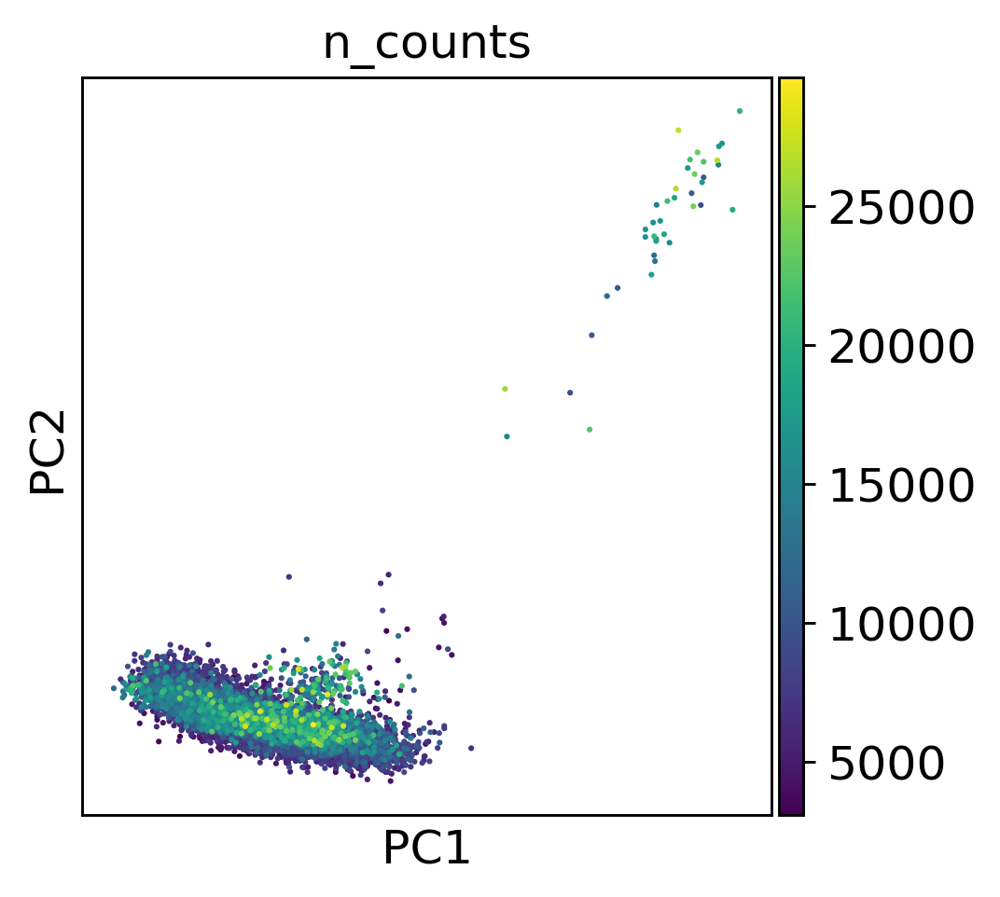

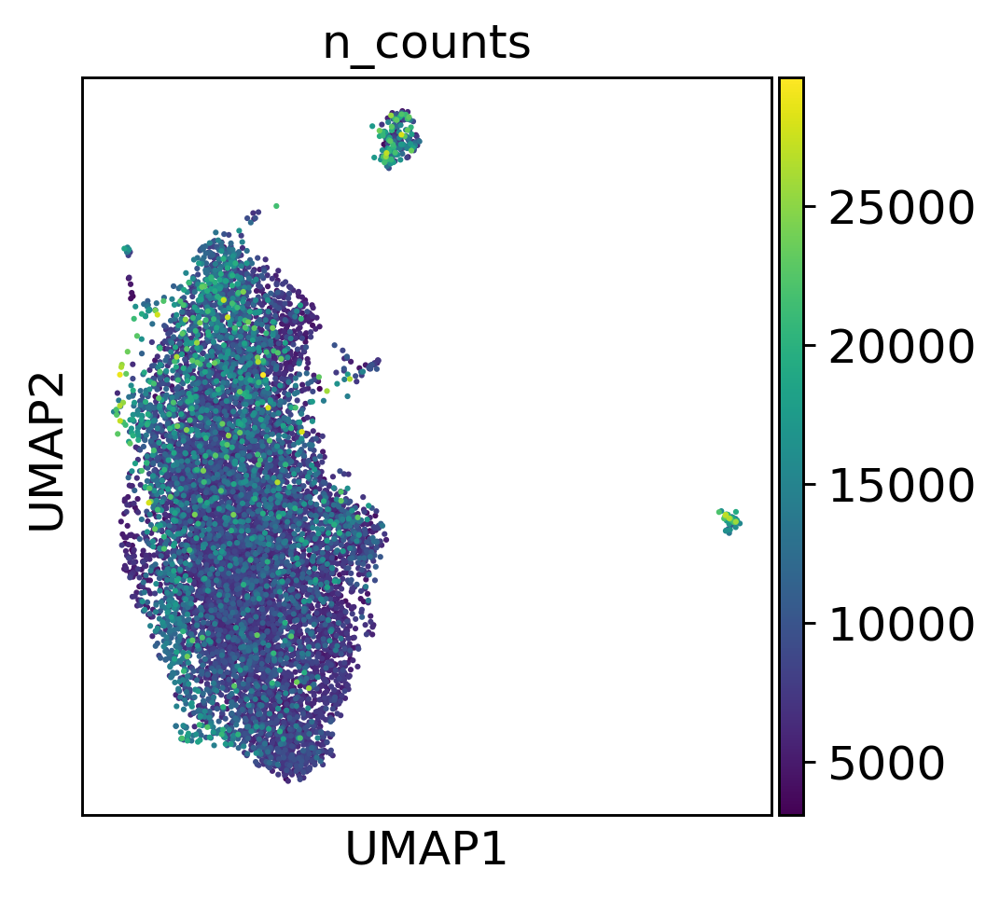

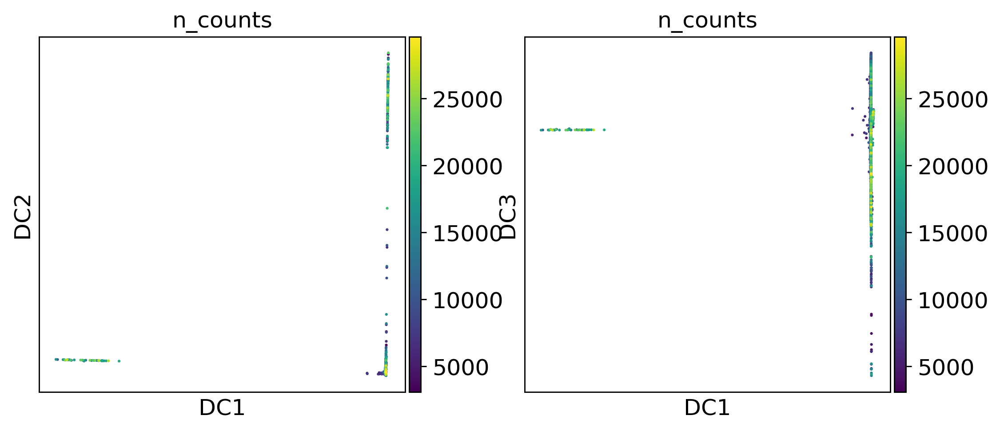

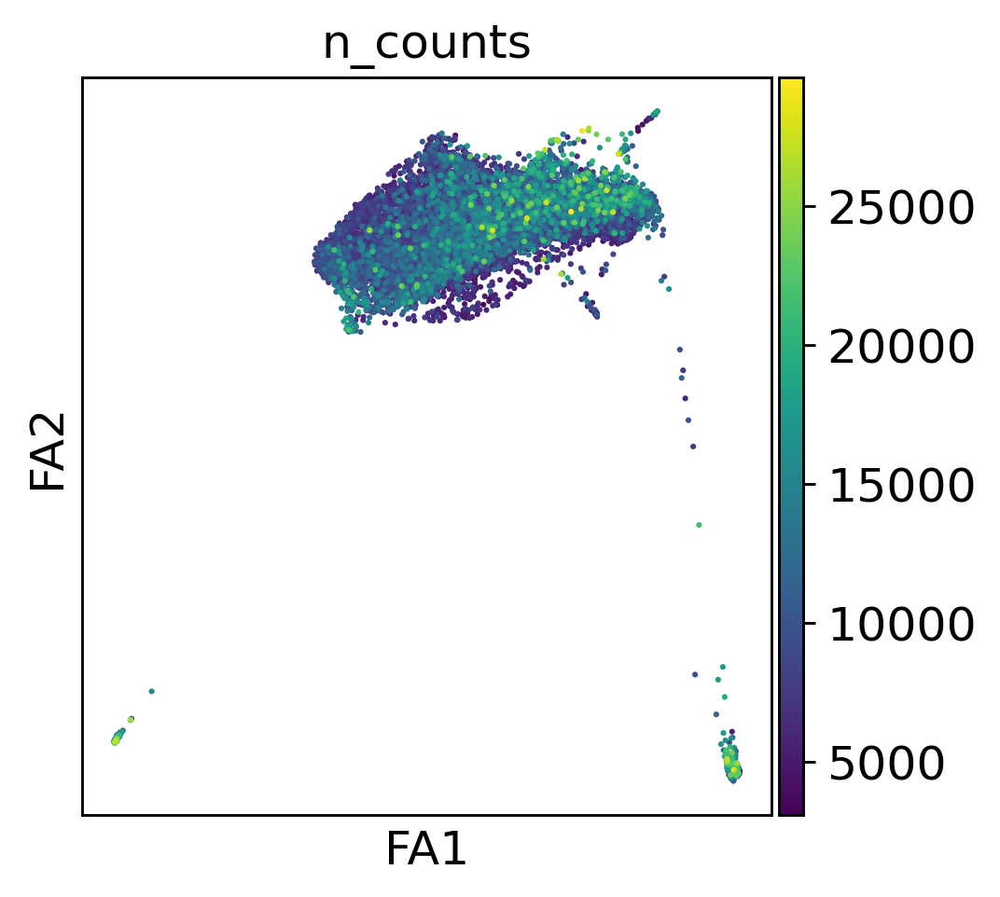

In [11]:
sc.pl.pca_scatter(adata, color='n_counts')

sc.pl.umap(adata, color='n_counts')
sc.pl.diffmap(adata, color='n_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata, color='n_counts')

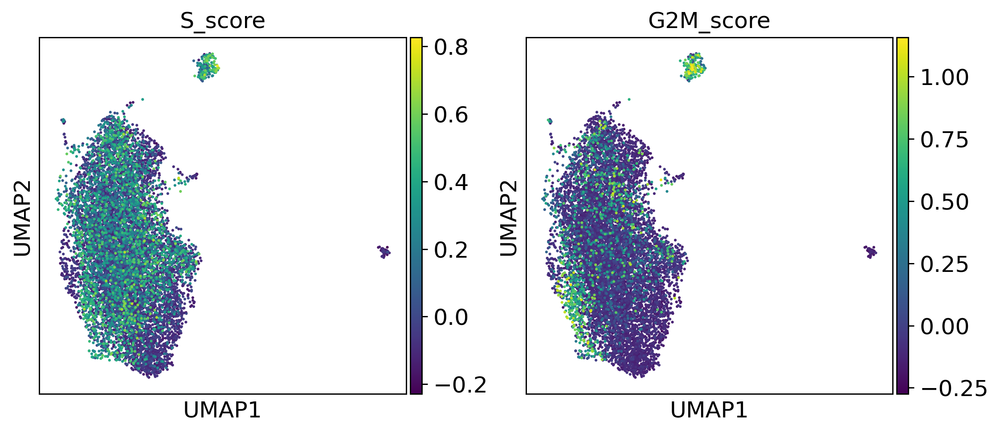

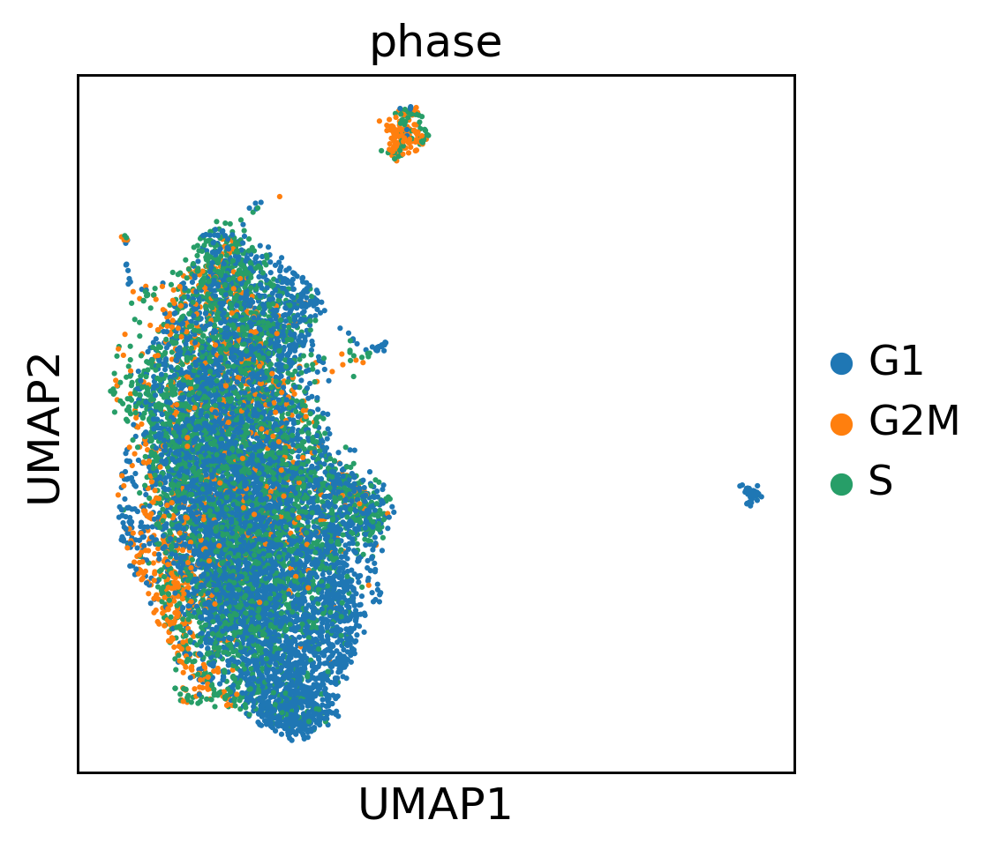

In [12]:
## Cell Cycle Effect ##
sc.pl.umap(adata, color=['S_score','G2M_score'], use_raw=False)
sc.pl.umap(adata, color='phase', use_raw=False)

## CLUSTERING ##

In [13]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.9, key_added='louvain_r0.9', random_state=0)
sc.tl.louvain(adata, resolution=0.85, key_added='louvain_r0.85', random_state=0)
sc.tl.louvain(adata, resolution=0.8, key_added='louvain_r0.8', random_state=0)
sc.tl.louvain(adata, resolution=0.75, key_added='louvain_r0.75', random_state=0)
sc.tl.louvain(adata, resolution=0.7, key_added='louvain_r0.7', random_state=0)
sc.tl.louvain(adata, resolution=0.6, key_added='louvain_r0.6', random_state=0)
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5', random_state=0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r0.9', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain_r0.85', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_r0.8', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_r0.75', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "lou

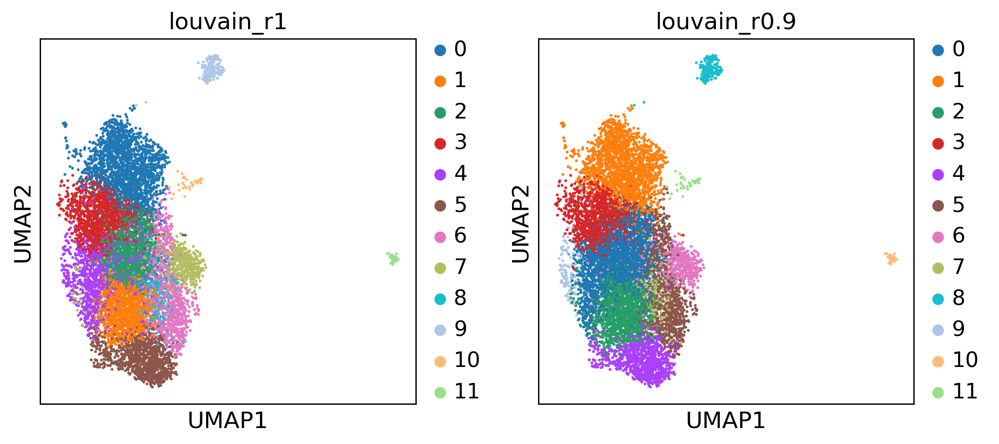

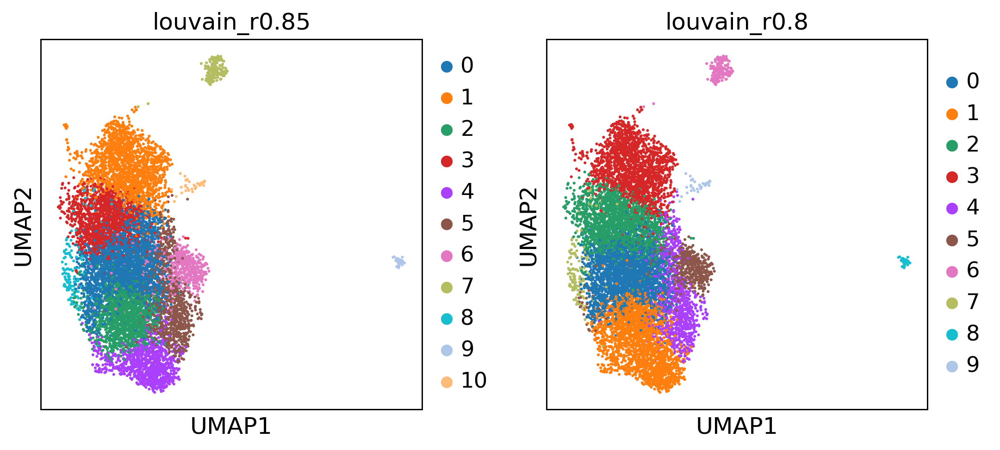

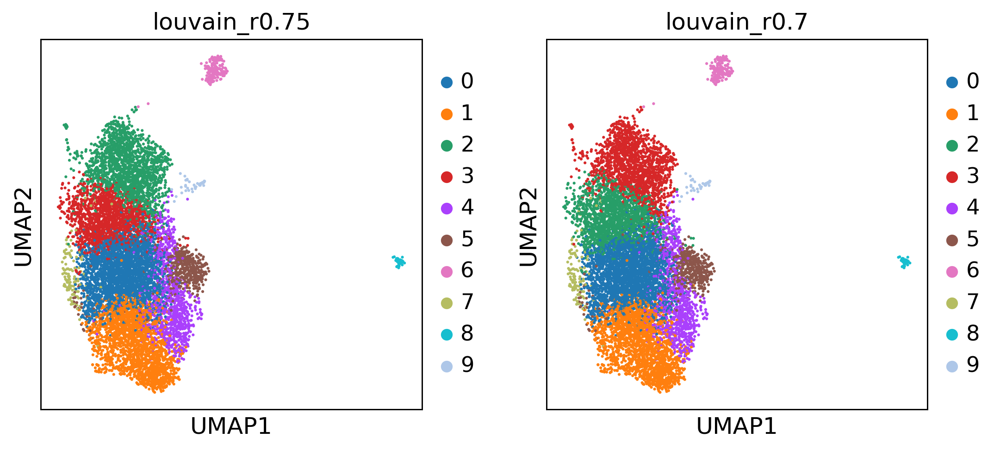

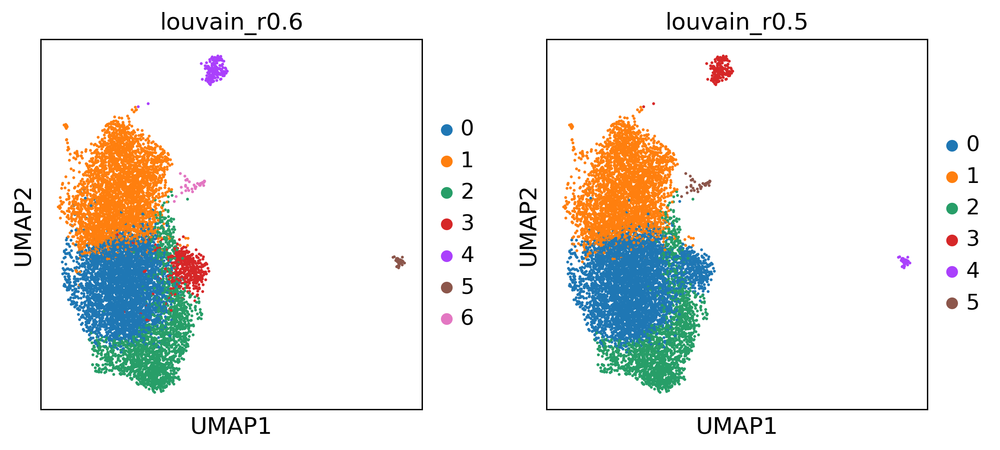

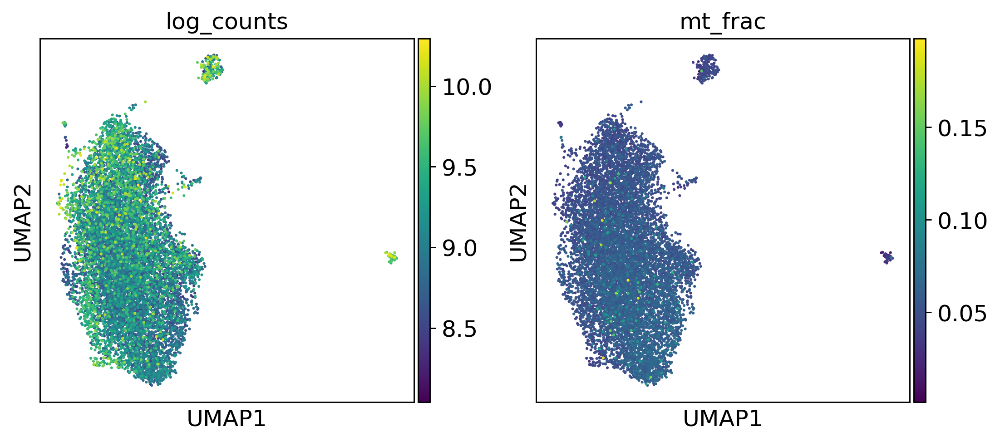

In [15]:
#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r1','louvain_r0.9'], palette=sc.pl.palettes.vega_20_scanpy)
sc.pl.umap(adata, color=['louvain_r0.85','louvain_r0.8'], palette=sc.pl.palettes.vega_20_scanpy)
sc.pl.umap(adata, color=['louvain_r0.75', 'louvain_r0.7'], palette=sc.pl.palettes.vega_20_scanpy)
sc.pl.umap(adata, color=['louvain_r0.6','louvain_r0.5'], palette=sc.pl.palettes.vega_20_scanpy)
sc.pl.umap(adata, color=['log_counts', 'mt_frac'])

## CALCULATE MARKER GENES ##

In [16]:
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.8', key_added='rank_genes_r0.8')

ranking genes
    finished: added to `.uns['rank_genes_r0.8']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


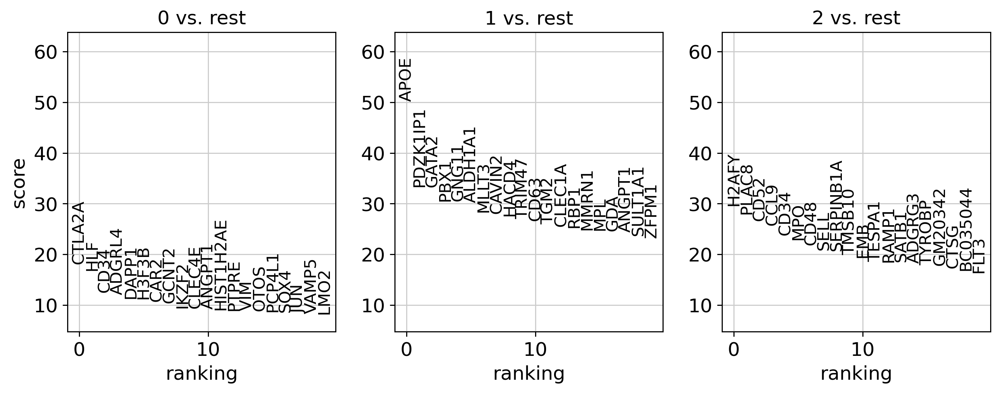

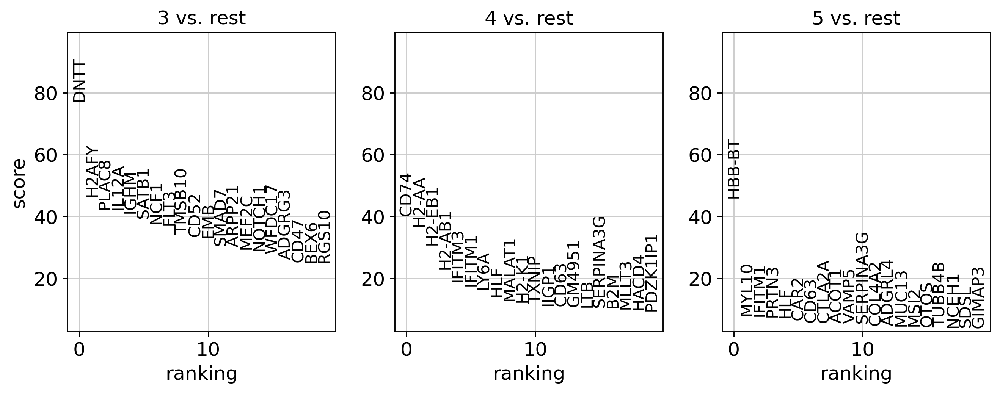

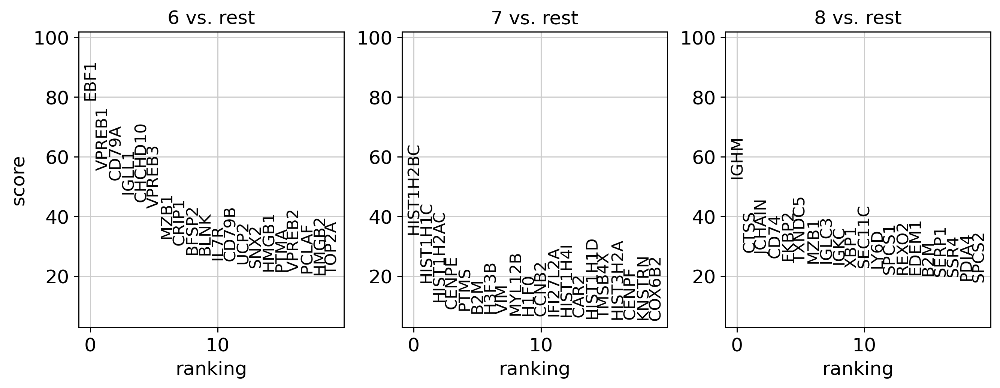

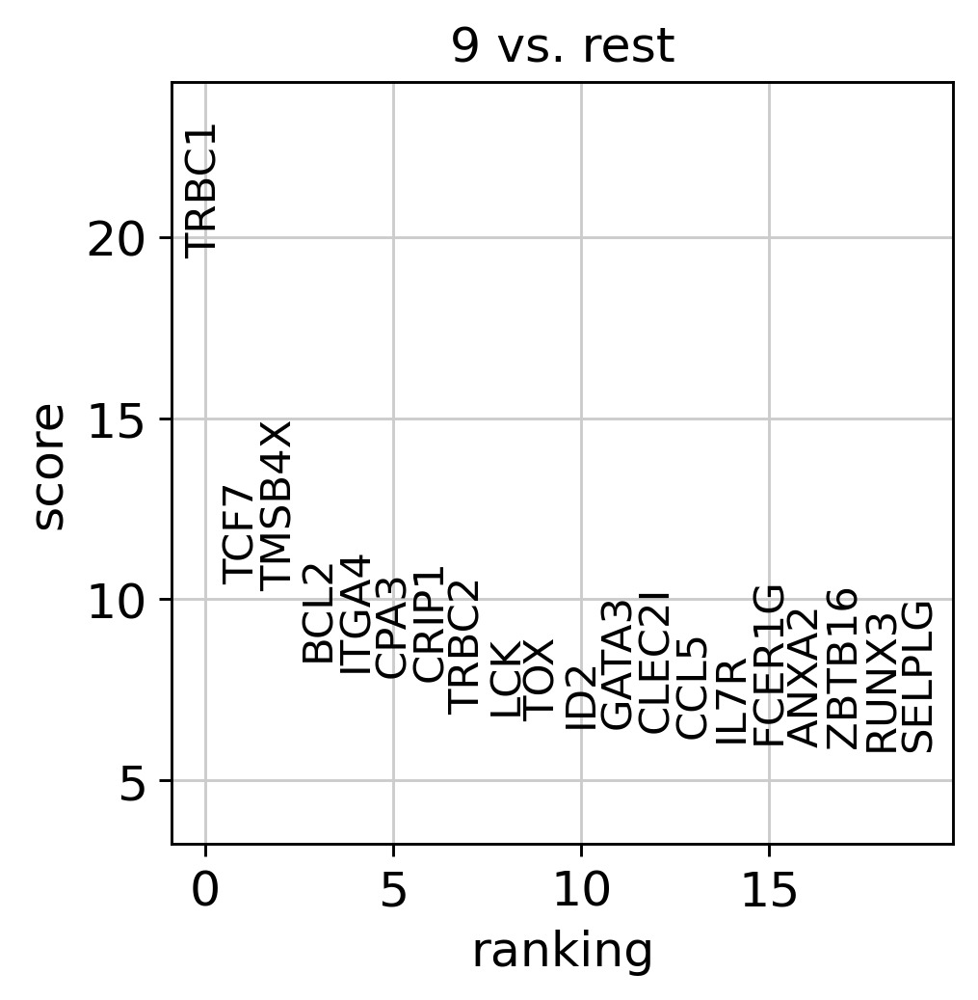

In [17]:
#Plot marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8', groups=['3','4','5'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8', groups=['6', '7', '8'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8', groups='9', fontsize=12)

## SUBCLUSTERING ##

In [18]:
#merge 2 clusters
sc.tl.louvain(adata, restrict_to=('louvain_r0.8', ['0','7']), resolution=0.1, key_added='louvain_r0.8_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain_r0.8_sub', the cluster labels (adata.obs, categorical) (0:00:00)


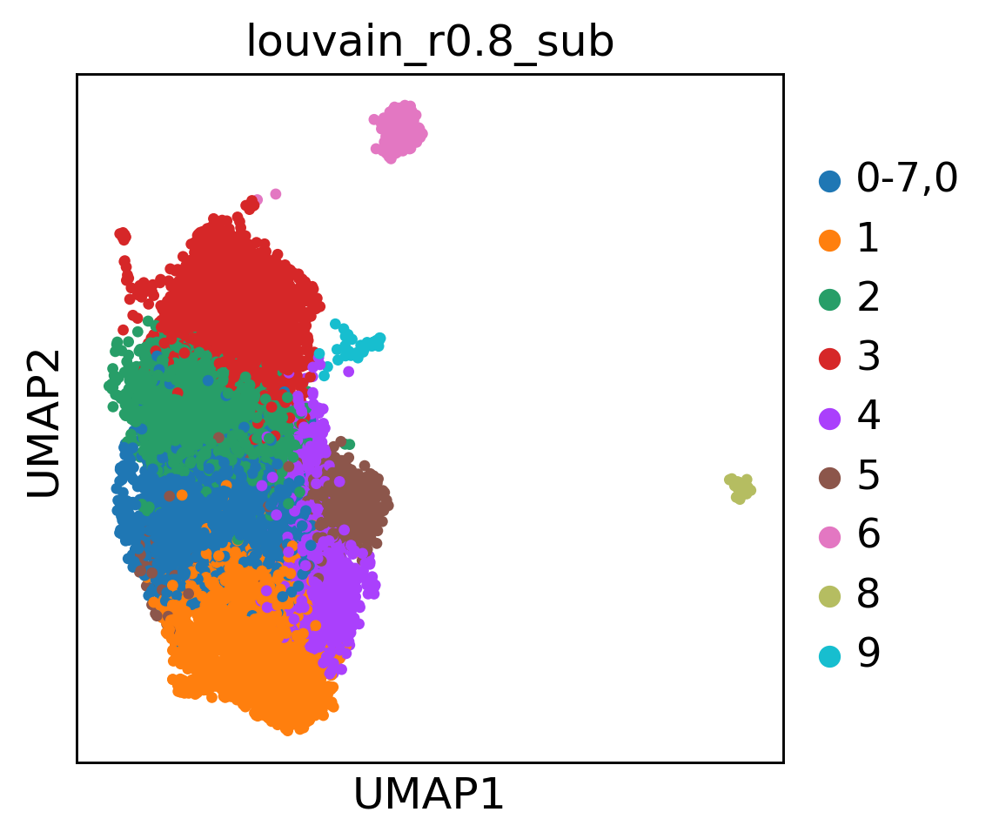

In [20]:
sc.pl.umap(adata, color=['louvain_r0.8_sub'], palette=sc.pl.palettes.vega_20_scanpy, size=50)

## RECALCULATE MARKER GENES ##

In [21]:
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.8_sub', key_added='rank_genes_r0.8_sub')

ranking genes
    finished: added to `.uns['rank_genes_r0.8_sub']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


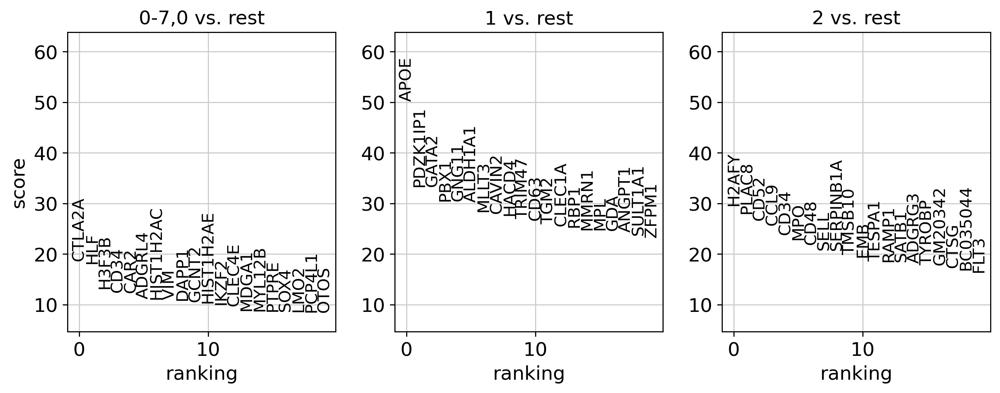

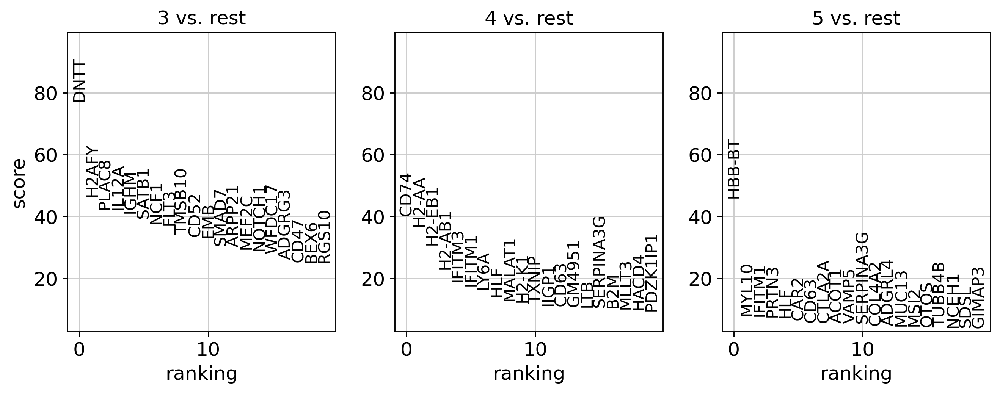

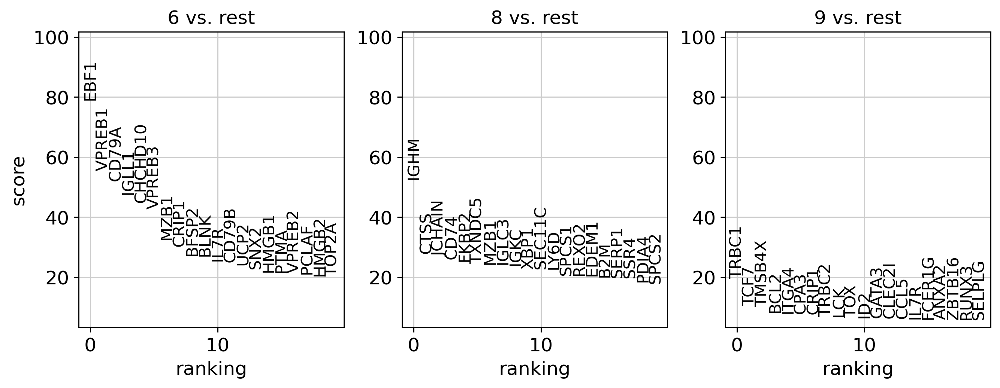

In [22]:
#Plot marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8_sub', groups=['0-7,0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8_sub', groups=['3','4','5'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.8_sub', groups=['6','8','9'], fontsize=12)

## NAMING CLUSTERS AND CLUSTER PERCENTAGES ##

In [23]:
adata.obs['louvain_final'] = adata.obs['louvain_r0.8_sub']

In [24]:
#Categories to rename
adata.obs['louvain_final'].cat.categories

Index(['0-7,0', '1', '2', '3', '4', '5', '6', '8', '9'], dtype='object')

In [25]:
adata.rename_categories('louvain_final', ['multi-potent stem cells','megakaryocyte/basophil progenitors',
    'neutrophil/monocyte progenitors','lymphoid progenitors','dendritic cell progenitors',
    'erythrocyte progenitors','pre-B cells','naive B cells','pre-T cells'])

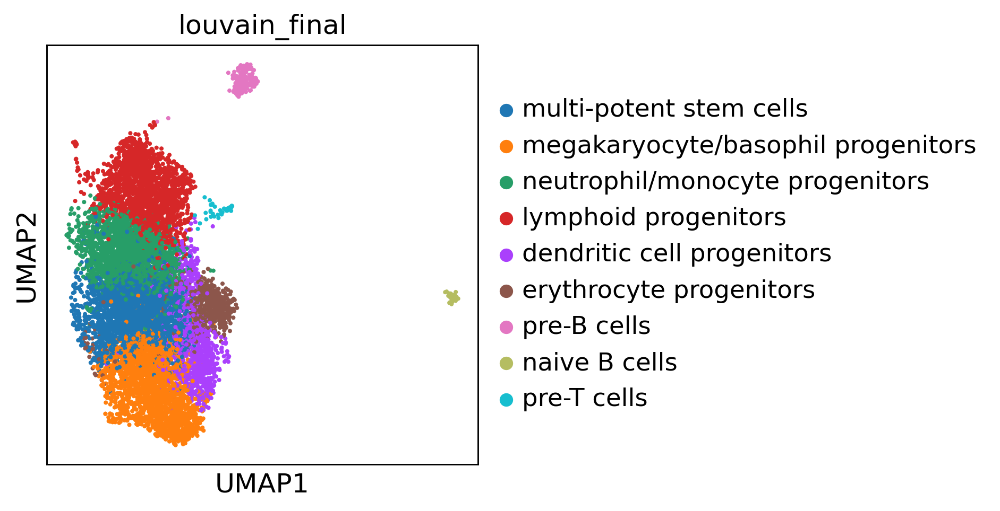

In [26]:
#combined UMAP
sc.pl.umap(adata, color=['louvain_final'], palette=sc.pl.palettes.vega_20_scanpy, size=20)

In [33]:
marker_genes = {'multi-potent stem cells': ['CTLA2A', 'HLF', 'CD34'],
                     'megakaryocyte/basophil progenitors': ['PBX1', 'CAVIN2', 'VWF', 'PF4', 'APOE', 'GATA2'],
                     'neutrophil/monocyte progenitors': ['MPO', 'CTSG'],
                     'lymphoid progenitors': ['DNTT', 'IL12A', 'SATB1', 'FLT3'],
                     'dendritic cell progenitors': ['CD74', 'H2-AA', 'H2-EB1'],
                     'erythrocyte progenitors': ['HBB-BT', 'HBA-A1', 'HBA-A2'],
                     'pre-B cells': ['EBF1', 'VPREB1', 'CD19', 'CD79A'],
                     'naive B cells': ['IGHM', 'JCHAIN', 'IGKC'],
                     'pre-T cells': ['TRBC1','TCF7']}

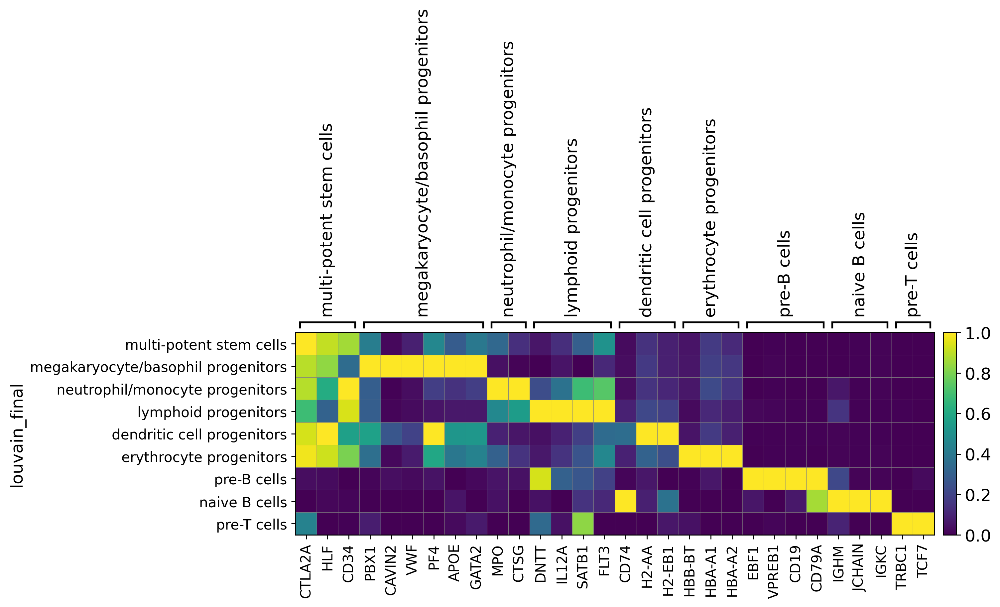

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[9.6, 0, 0.2])

In [34]:
sc.pl.matrixplot(adata, marker_genes, groupby='louvain_final', standard_scale='var')